# Willman 1: Properties from member sample

Import necessary packages

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None) # display whole table in line
pd.set_option('display.max_rows', None)

import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.patches import Polygon
from scipy import stats

from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.table import Table

import properties_utils as pu
import wil1_properties
from wil1_properties import ra_w1, dec_w1, aax, bax, r_half_pc, r_half_pc_err

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
# some code for prettier plots
%config InlineBackend.figure_format = 'retina'
plt.rcParams.update({'axes.linewidth' : 1,
                     'ytick.major.width' : 1,
                     'ytick.minor.width' : 1,
                     'xtick.major.width' : 1,
                     'xtick.minor.width' : 1,
                     'xtick.labelsize': 12, 
                     'ytick.labelsize': 12,
                     'axes.labelsize': 16,
                     'font.family': 'Serif',
                     'figure.figsize': (10, 6),
                     'xtick.direction': 'in',
                     'ytick.direction': 'in',
                     'xtick.major.size': 8,
                     'ytick.major.size': 8,
                     'xtick.minor.size': 4,
                     'ytick.minor.size': 4})

## Open data & data overview

In [3]:
# open munoz full photometry
munoz_phot = pd.read_csv("data/munoz_wil1_phot_evaluated.csv", index_col = 0)

# open deimos data evaluated for membership
deimos_data = pd.read_csv("data/dmost_cutdata_evaluated.csv", index_col = 0)

In [6]:
member_mask     = (deimos_data["prob_member"] >= 0.5)
threerhalf_mask = (deimos_data["hl_radius_ell"] <= 3)
onerhalf_mask   = (deimos_data["hl_radius_ell"] <= 1)
gaia_mask       = (deimos_data["gaia_pmra_err"] > 0) & (deimos_data["pm_err_flag"] == 0)
mult_mask       = (deimos_data["flag_var"] != -99)
met_mask        = (deimos_data["ew_feh_err"] > 0)
variable        = (deimos_data["flag_var"] == 1)
blue_straggler  = (deimos_data["prob_member"] == 0.5)

member_tot          = deimos_data[member_mask]
w1_members          = deimos_data[member_mask & threerhalf_mask & ~variable]
gaia_members        = deimos_data[member_mask & gaia_mask]
rhalf_members       = deimos_data[member_mask & onerhalf_mask & ~variable] # mult_mask
members_met         = deimos_data[member_mask & threerhalf_mask & met_mask & ~blue_straggler]
mems_meas, mems_var = deimos_data[member_mask & mult_mask], deimos_data[member_mask & variable]

print("Members + gaia:                        {}".format(len(deimos_data[member_mask & gaia_mask])))
print("Members, <1rhalf:                      {}".format(len(deimos_data[member_mask & onerhalf_mask])))
print("Members, <1rhalf, mult epochs, no var: {}".format(len(deimos_data[member_mask & onerhalf_mask & mult_mask & ~variable])))
print("Members, mult epochs:                  {}".format(len(mems_meas)))
print("Member (<3 rhalf, no var):             {}".format(len(w1_members)))
print("Members + rgb/met:                     {}".format(len(members_met)))
print("Members total:                         {}".format(len(member_tot)))
print("{} variable(s) out {} measured.\n".format(len(mems_var), len(mems_meas)))

Members + gaia:                        7
Members, <1rhalf:                      28
Members, <1rhalf, mult epochs, no var: 19
Members, mult epochs:                  37
Member (<3 rhalf, no var):             49
Members + rgb/met:                     7
Members total:                         56
6 variable(s) out 37 measured.



In [34]:
deimos_data["sample"] = 0
deimos_data.loc[member_mask, "sample"] = 1

deimos_data.loc[blue_straggler, "ew_feh"] = np.nan
deimos_data.loc[blue_straggler, "ew_feh_err"] = np.nan

## Figure 2: Spatial + CMD

In [7]:
# photometry data
full_phot1 = munoz_phot[(munoz_phot["hl_radius_ell"] < 3) & (munoz_phot["rmag_o"] < 23) & (munoz_phot["cmd_marker"] > 0.5)]
full_phot2 = munoz_phot[(munoz_phot["hl_radius_ell"] <= 3)]

iso_data = pd.read_csv("data/isochrone_data_0001.csv")
gr_iso, r_iso = iso_data["gr"], iso_data["r"]

In [8]:
thresh = 0.5
nodes = [0, thresh, thresh, 1.0]

# purple
orig_cmap_purp = plt.colormaps["Purples"]
colors_purp = ["#B3B6B7", "#B3B6B7", orig_cmap_purp(0.5), orig_cmap_purp(0.99)]
new_purple_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", list(zip(nodes, colors_purp)))

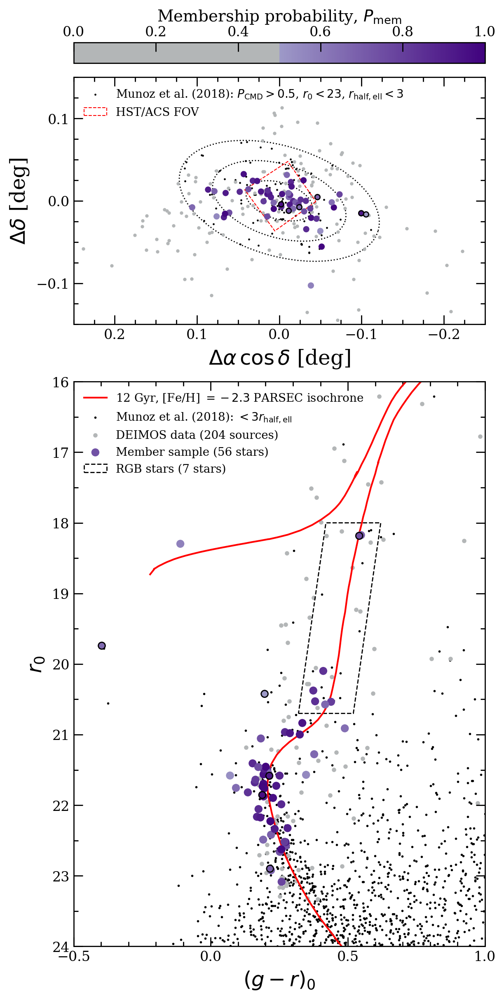

In [9]:
fig, axes = plt.subplots(2, 1, figsize = (6, 12), height_ratios = [1, 2], constrained_layout = True)

### SPATIAL ###
axes[0].set_aspect('equal', adjustable='box')

# half-light radii
for ii in range(3):
    jj = 2 * (ii + 1)
    ellipse = Ellipse((0, 0), bax * jj, aax * jj, angle = 360-73, fill = False, linestyle = ":", edgecolor = "black")
    axes[0].add_patch(ellipse)

axes[0].scatter(full_phot1["delta_ra_cos_dec"], full_phot1["delta_dec"], marker = "o", c = "black", s = 0.5, zorder = 0, 
                label = r"Munoz et al. (2018): $P_{\rm CMD} > 0.5$, $r_0 < 23$, $r_{\rm half, ell} < 3$")
axes[0].scatter(deimos_data["delta_ra_cosdec"], deimos_data["delta_dec"], c = "#B3B6B7", s = 4, zorder = 1)
spatialdata = axes[0].scatter(member_tot["delta_ra_cosdec"], member_tot["delta_dec"], c = member_tot["prob_member"], 
                              s = 20, cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 2)
axes[0].scatter(mems_var["delta_ra_cosdec"], mems_var["delta_dec"], c = mems_var["prob_member"], 
                              edgecolor = "black", s = 20, cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)

hst_box = Polygon([((162.2807 - ra_w1) * np.cos(dec_w1), 51.0492 - dec_w1), ((162.3513 - ra_w1) * np.cos(dec_w1), 51.0136 - dec_w1), 
                   ((162.4029 - ra_w1) * np.cos(dec_w1), 51.0635 - dec_w1), ((162.3289 - ra_w1) * np.cos(dec_w1), 51.0979 - dec_w1)], 
                   fill = False, edgecolor = "red", linestyle = "--", linewidth = 0.75, label = "HST/ACS FOV", zorder = 1)
axes[0].add_patch(hst_box)

axes[0].set_xlabel(r"$\Delta \alpha \, \cos \delta$ [deg]", labelpad = 5, size = 18).set_color('black')
axes[0].set_ylabel(r"$\Delta \delta$ [deg]", labelpad = 5, size = 18).set_color('black')

axes[0].set_xticks(np.arange(-0.5, 0.6, .1), minor = False)
axes[0].set_xticks(np.arange(-0.5, 0.6, 0.025), minor = True)
axes[0].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 12, color = "black", top = True)
axes[0].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0].set_yticks(np.arange(-0.2, 0.3, 0.1), minor = False)
axes[0].set_yticks(np.arange(-0.2, 0.3, 0.025), minor = True)
axes[0].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 12, color = "black", right = True)
axes[0].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

cbar = fig.colorbar(spatialdata, ax = axes[0], location = "top")
cbar.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 14)

axes[0].set_xlim(0.25, -0.25)
axes[0].set_ylim(-0.15, 0.15)

axes[0].legend(loc = "upper left", fontsize = 10, frameon = False)

### CMD ###
axes[1].plot(gr_iso, r_iso, c = "red", zorder = 2, label = r"12 Gyr, [Fe/H] $= -2.3$ PARSEC isochrone")

axes[1].scatter(full_phot2["gmag_o"] - full_phot2["rmag_o"], full_phot2["rmag_o"], marker = "o", c = "black", s = 1, zorder = 0, 
                label = r"Munoz et al. (2018): $< 3r_{\rm half, ell}$")
axes[1].scatter(deimos_data["gmag_o"] - deimos_data["rmag_o"], deimos_data["rmag_o"], c = "#B3B6B7", s = 8, 
                zorder = 1, label = f"DEIMOS data ({len(deimos_data)} sources)")
cmddata = axes[1].scatter(member_tot["gmag_o"] - member_tot["rmag_o"], member_tot["rmag_o"], c = member_tot["prob_member"], 
                          cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3, 
                          label = f"Member sample ({len(member_tot)} stars)")
cmddata = axes[1].scatter(mems_var["gmag_o"] - mems_var["rmag_o"], mems_var["rmag_o"], c = mems_var["prob_member"], 
                          edgecolor = "black", cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)

rgb_box = Polygon([(0.32, 20.7), (0.52, 20.7), (0.62, 18), (0.42, 18)], fill = False, edgecolor = "black", 
                  linestyle = '--', linewidth = 1, label = f"RGB stars ({len(members_met)} stars)")
axes[1].add_patch(rgb_box)

axes[1].set_xlabel("$(g-r)_0$", labelpad = 5, size = 18).set_color('black')
axes[1].set_ylabel("$r_0$", labelpad = 5, size = 18).set_color('black')

axes[1].set_xticks(np.arange(-0.5, 1.5, 0.5), minor = False)
axes[1].set_xticks(np.arange(-0.5, 1.1, 0.1), minor = True)
axes[1].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 12, color = "black", top = True)
axes[1].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1].set_yticks(np.arange(16, 26, 1), minor = False)
axes[1].set_yticks(np.arange(15, 25.5, 0.5), minor = True)
axes[1].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 12, color = "black", right = True)
axes[1].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[1].set_xlim(-0.5, 1)
axes[1].set_ylim(24, 16)

axes[1].legend(loc = "upper left", fontsize = 10, frameon = False)

fig.savefig("plots/2_member_sample.pdf", dpi = 600, transparent = True)

## FIGURE 3: Velocity distribution

In [13]:
# weighted rolling average, bootstrapping over exclusive sample
radius, vel, vel_center, vel_lower, vel_upper, vel_stdev = pu.weighted_rolling_bootstrap(1000, 7, w1_members)
radius_proj, vel_proj, vel_c_proj, vel_l_proj, vel_u_proj, vel_stdev_proj = pu.weighted_rolling_bootstrap(1000, 7, w1_members, r_col = "r_proj")

# data
exclusive_right = w1_members[w1_members["r_proj"] > 0]
exclusive_left = w1_members[w1_members["r_proj"] < 0]

mask = (deimos_data["flag_var"] != 1)

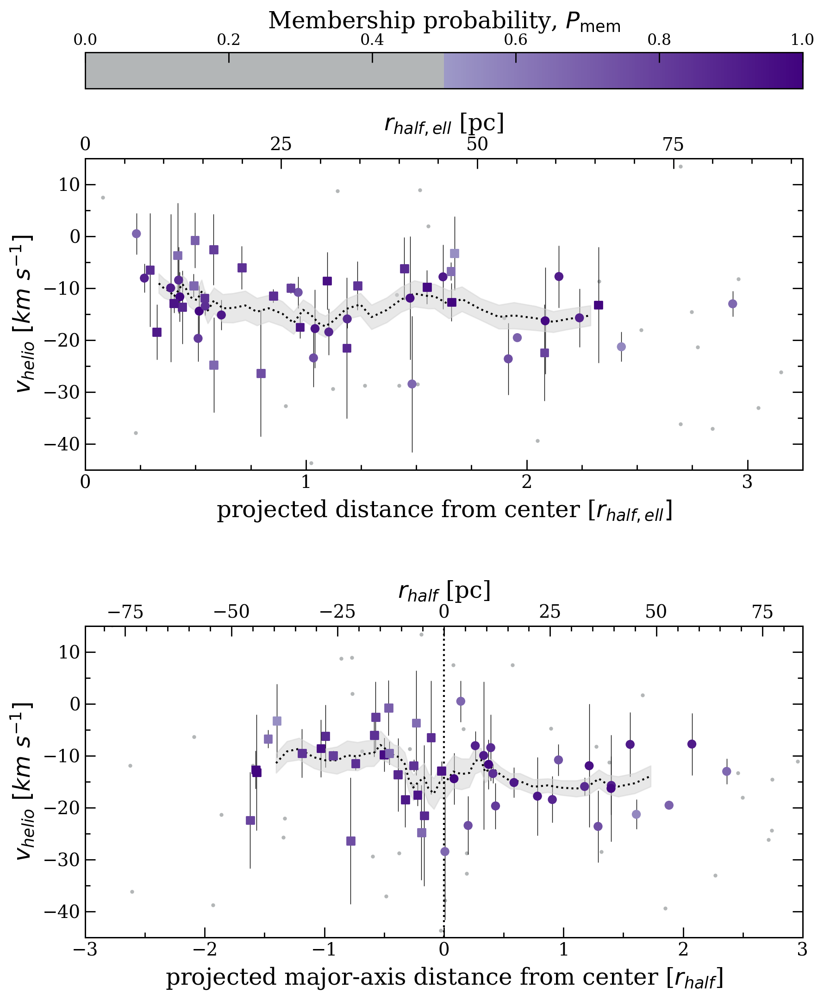

In [14]:
fig, axes = plt.subplots(2, 1, figsize = (10, 14))
plt.subplots_adjust(hspace = 0.5)

total_ax = axes.ravel().tolist()

#### exclusive member sample ###
axes[0].scatter(deimos_data[mask]["hl_radius_ell"], deimos_data[mask]["v"], c = "#B3B6B7", s = 4, zorder = 0)
axes[0].errorbar(w1_members["hl_radius_ell"], w1_members["v"], yerr = w1_members["v_err"], 
                 elinewidth = .5, c = "black", fmt = "o", ms = 1, zorder = 1)
data = axes[0].scatter(exclusive_right["hl_radius_ell"], exclusive_right["v"], c = exclusive_right["prob_member"], 
                       cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)
data = axes[0].scatter(exclusive_left["hl_radius_ell"], exclusive_left["v"], c = exclusive_left["prob_member"], 
                       marker = "s", cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)

axes[0].fill_between(radius, vel - vel_stdev, vel + vel_stdev, color = "lightgrey", alpha = 0.5, zorder = 2)
axes[0].plot(radius, vel, linestyle = ":", c = "black", zorder = 2)

axes[0].set_xlabel("projected distance from center [$r_{half, ell}]$", labelpad = 5, size = 18).set_color('black')
axes[0].set_ylabel("$v_{helio}~[km~s^{-1}]$", labelpad = 5, size = 18).set_color('black')

axes[0].set_xticks(np.arange(0, 7, 1), minor = False)
axes[0].set_xticks(np.arange(0, 6.25, 0.25), minor = True)
axes[0].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[0].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0].set_yticks(np.arange(-50, 30, 10), minor = False)
axes[0].set_yticks(np.arange(-50, 30, 5), minor = True)
axes[0].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[0].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[0].set_xlim(0, 3.25)
axes[0].set_ylim(-45, 15)

axes01 = axes[0].twiny()
axes01.set_xlabel(r'$r_{half,ell}$ [pc]', labelpad = 5, size = 18).set_color('black')
axes01.set_xticks(np.arange(0, 200, 25), minor = False)
axes01.set_xticks(np.arange(0, 200, 5), minor = True)
axes01.tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black")
axes01.tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black")
mn, mx = axes[0].get_xlim()
axes01.set_xlim(mn * r_half_pc, mx * r_half_pc)

#### unfolded velocity plot ###
axes[1].scatter(deimos_data[mask]["r_proj"], deimos_data[mask]["v"], c = "#B3B6B7", s = 4, zorder = 0)
axes[1].errorbar(w1_members["r_proj"], w1_members["v"], yerr = w1_members["v_err"], 
                 elinewidth = .5, c = "black", fmt = "o", ms = 2, zorder = 1)
data2 = axes[1].scatter(exclusive_right["r_proj"], exclusive_right["v"], c = exclusive_right["prob_member"], 
                        cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)
axes[1].scatter(exclusive_left["r_proj"], exclusive_left["v"], c = exclusive_left["prob_member"], marker = "s", 
                cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)

axes[1].fill_between(radius_proj, vel_proj - vel_stdev_proj, vel_proj + vel_stdev_proj, color = "lightgrey", alpha = 0.5, zorder = 2)
axes[1].plot(radius_proj, vel_proj, linestyle = ":", c = "black", zorder = 2)

axes[1].axvline(x = 0, linestyle = ":", c = "black")

axes[1].set_xlabel("projected major-axis distance from center [$r_{half}$]", labelpad = 5, size = 18).set_color('black')
axes[1].set_ylabel("$v_{helio}~[km~s^{-1}]$", labelpad = 5, size = 18).set_color('black')

axes[1].set_xticks(np.arange(-4, 5, 1), minor = False)
axes[1].set_xticks(np.arange(-4.5, 4.75, 0.5), minor = True)
axes[1].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[1].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1].set_yticks(np.arange(-50, 30, 10), minor = False)
axes[1].set_yticks(np.arange(-50, 30, 5), minor = True)
axes[1].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[1].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[1].set_xlim(-3, 3)
axes[1].set_ylim(-45, 15)

axes02 = axes[1].twiny()
axes02.set_xlabel(r'$r_{half}$ [pc]', labelpad = 5, size = 18).set_color('black')
axes02.set_xticks(np.arange(-150, 200, 25), minor = False)
axes02.set_xticks(np.arange(-150, 200, 5), minor = True)
axes02.tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black")
axes02.tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black")
mn2, mx2 = axes[1].get_xlim()
axes02.set_xlim(mn2 * r_half_pc, mx2 * r_half_pc)

cbar = plt.colorbar(data, ax = total_ax, location = "top", pad = 0.07)
cbar.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 18)

fig.savefig("plots/3_velocity_dist.pdf", dpi = 600, transparent = True)

In [15]:
np.max(vel) - np.min(vel), np.sqrt(vel_stdev[np.argmax(vel)]**2 + vel_stdev[np.argmin(vel)]**2)

(8.293865829591086, 2.7687825313777936)

## FIGURE 4: Velocity corner plots

In [16]:
from wil1_properties import v_avg2011, v_disp2011

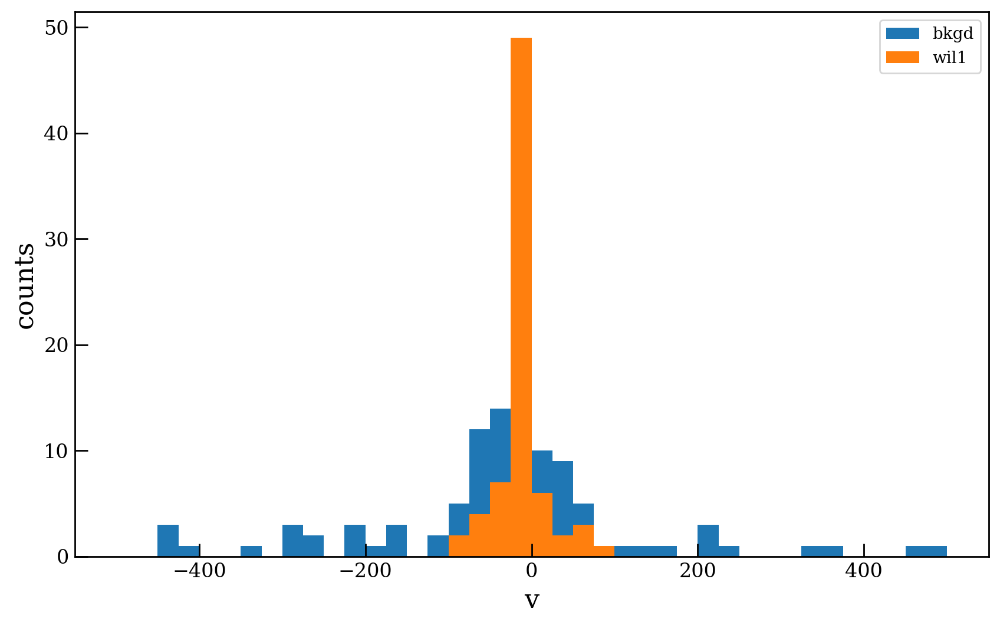

In [17]:
deimos_data["prob_nov"] *= (np.abs(deimos_data["v"]) < 100)

cut = 0.1
wil1 = deimos_data[(deimos_data["prob_nov"] > cut) & (deimos_data["hl_radius_ell"] < 6) & (deimos_data["flag_var"] != 1)]
bkgd = deimos_data[(deimos_data["prob_nov"] < cut) & (deimos_data["hl_radius_ell"] < 6) & (deimos_data["flag_var"] != 1)]

plt.hist(bkgd["v"], range = [-500, 500], bins = 40, label = "bkgd")
plt.hist(wil1["v"], range = [-500, 500], bins = 40, label = "wil1")
plt.xlabel("v")
plt.ylabel("counts")
plt.legend()

In [60]:
# create table for paper
mixture_mask = (deimos_data["hl_radius_ell"] < 3) & (deimos_data["flag_var"] != 1) & (deimos_data["prob_nov"] > 0.1)
member_mask  = (deimos_data["prob_member"] >= 0.5)
table = deimos_data[mixture_mask | member_mask]

# formatting
table = table.sort_values("rmag_o")
table = table[["RA", "DEC", "v", "v_err", "rmag_o", "rmag_err", "gmag_o", "gmag_err", "ew_feh", "ew_feh_err",
               "gaia_source_id", "flag_var", "prob_member", "sample"]]
table["v"] = table["v"].apply(lambda x: f"${x:.2f}$")
table["v_err"] = table["v_err"].apply(lambda x: f"{x:.2f}")
table["gmag_o"] = table["gmag_o"].apply(lambda x: f"{x:.3f}")
table["gmag_err"] = table["gmag_err"].apply(lambda x: f"{x:.3f}")
table["rmag_o"] = table["rmag_o"].apply(lambda x: f"{x:.3f}")
table["rmag_err"] = table["rmag_err"].apply(lambda x: f"{x:.3f}")
table["ew_feh"] = table["ew_feh"].apply(lambda x: f"${x:.2f}$" if ((x != -999) & (x != -99) & ~np.isnan(x)) else "--")
table["ew_feh_err"] = table["ew_feh_err"].apply(lambda x: f"{x:.2f}" if ((x != -999) & (x != -99) & ~np.isnan(x)) else "--")
table["gaia_source_id"] = table["gaia_source_id"].apply(lambda x: x if ((x != -999) & (x != -99) & ~np.isnan(x)) else "--")
table["prob_member"] = table["prob_member"].apply(lambda x: f"{x:.2f}")
table["flag_var"] = table["flag_var"].apply(lambda x: x if ((x != -999) & (x != -99) & ~np.isnan(x)) else "--")

table.to_latex("data/member_table_paper.tex", index = False, escape = False, column_format = "ccccccccccccc")

In [106]:
cut_deimos = deimos_data[(deimos_data["hl_radius_ell"] < 3) & (deimos_data["flag_var"] != 1) & (deimos_data["prob_nov"] > 0.1)]
nn = len(cut_deimos)
print(nn)
print(len(cut_deimos[cut_deimos["sample"] == 1]) / nn)
priors = {'mu1': (0, 25),
          'sig1': (50, 10),
          'mu2': (v_avg2011, 2),
          'sig2': (v_disp2011, 2),
          'f': (0.74, 0.1)}

sampler, samples, v_mem, verr_mem, sig_mem, sigp_mem, sigm_mem = pu.mcmc_mixture(cut_deimos["v"], cut_deimos["v_err"], priors, nsteps = 3000)
pu.save_variable("vsys", [v_mem, verr_mem])
pu.save_variable("vdisp", [sig_mem, sigp_mem, sigm_mem])

66
0.7424242424242424


  0%|          | 0/3000 [00:00<?, ?it/s]/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 3000/3000 [02:17<00:00, 21.80it/s]


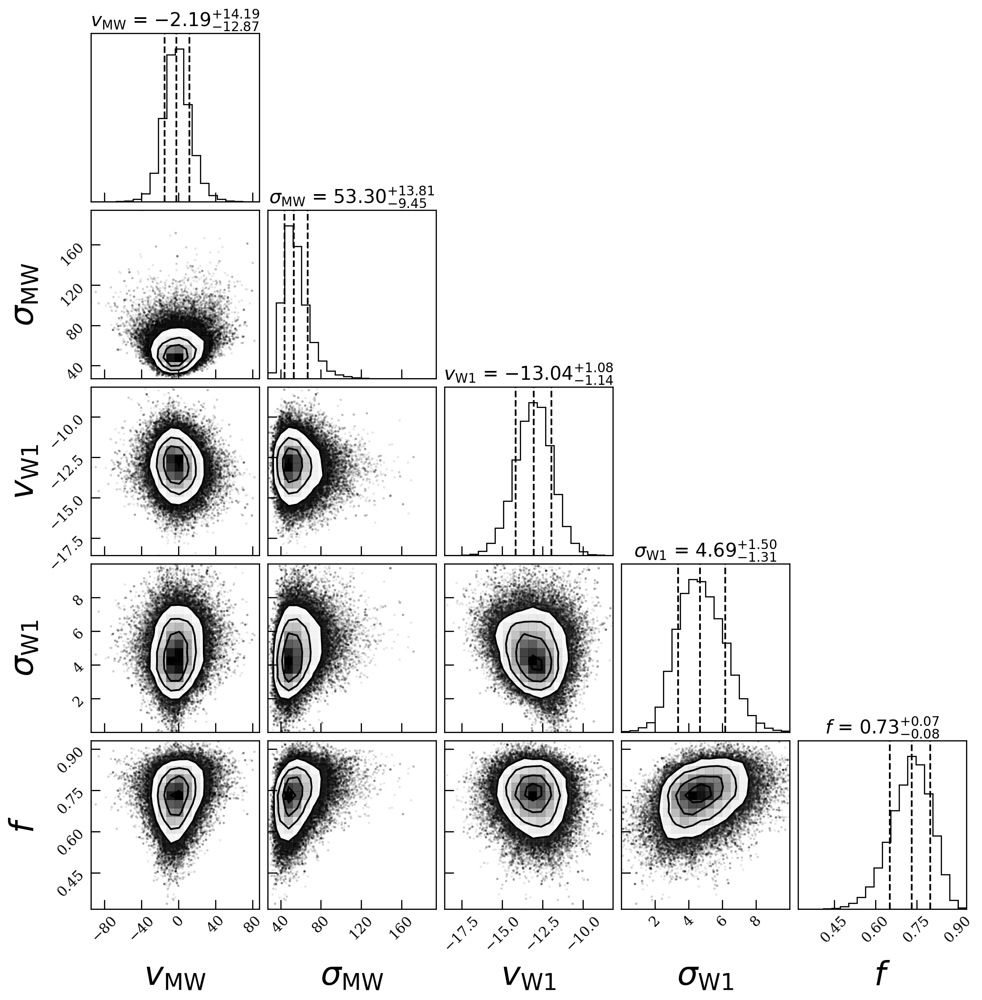

Posterior medians: {'$v_{\\rm MW}$': -2.1857261174460145, '$\\sigma_{\\rm MW}$': 53.30174634359511, '$v_{\\rm W1}$': -13.03994616473921, '$\\sigma_{\\rm W1}$': 4.688559339564653, '$f$': 0.7321773045829815}


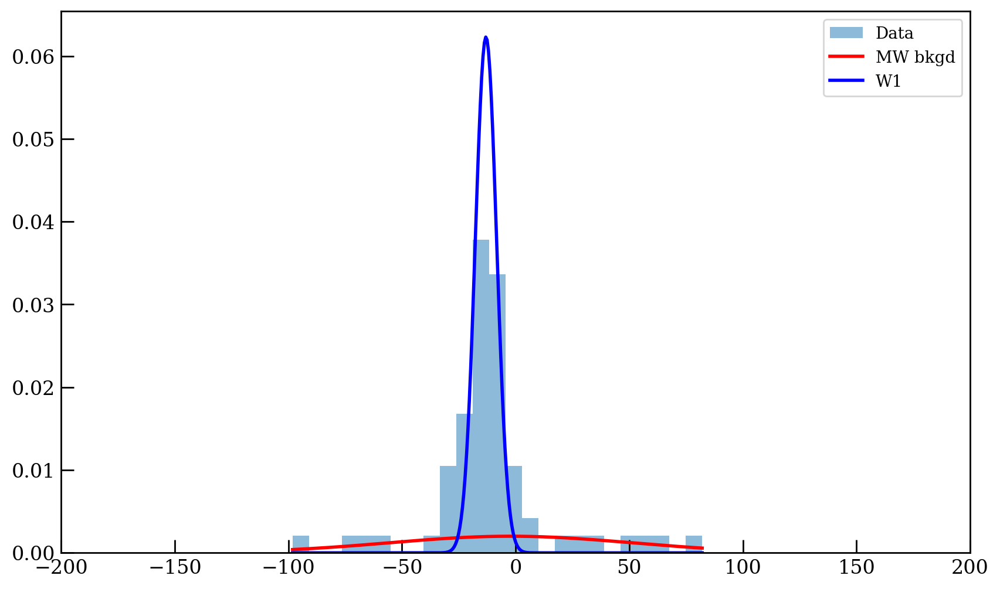

In [111]:
best = pu.plot_mixture_results(samples, cut_deimos["v"], figname = "plots/4_mcmc.pdf")

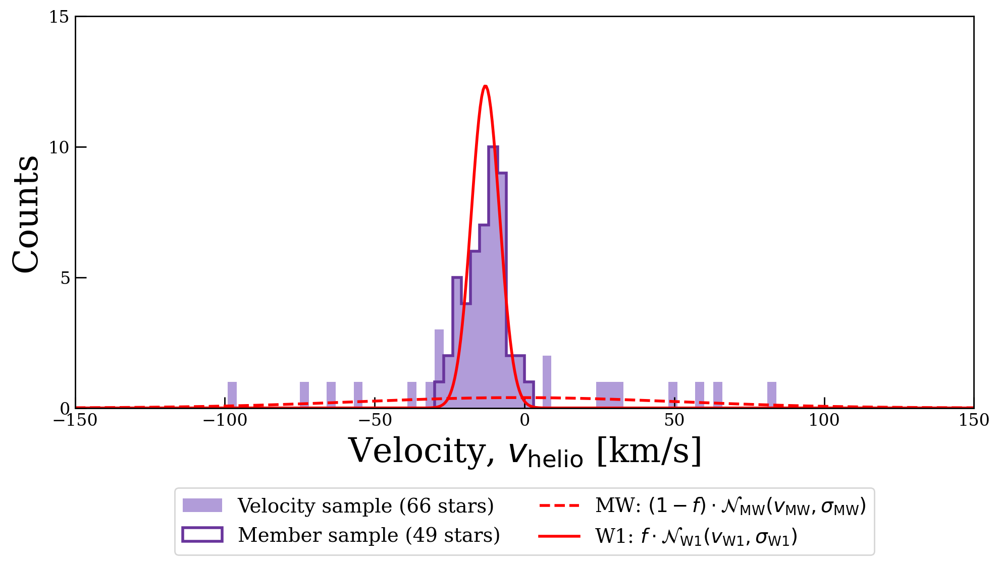

In [112]:
from scipy.stats import kurtosis, skew, norm
theta_best = np.median(samples, axis=0)

# plot fit
nbin = 100
mu1, sig1, mu2, sig2, f = theta_best
vgrid = np.linspace(-150, 150, 600)
pdf1 = (1-f) * norm.pdf(vgrid, mu1, sig1) * (300/nbin) * nn
pdf2 = f * norm.pdf(vgrid, mu2, sig2) * (300/nbin) * nn

fig = plt.figure(figsize = (10, 6))
ax = fig.gca()

ax.hist(cut_deimos["v"], bins = nbin, range = [-150, 150], density = False, color = "#b19cd9", label = f"Velocity sample ({nn} stars)")
ax.hist(w1_members["v"], bins = nbin, range = [-150, 150], histtype = "step", lw = 2, density = False, color = "#69359c", label = f"Member sample ({len(w1_members)} stars)")
ax.plot(vgrid, pdf1, c = "red", ls = "--", lw = 2, label = r"MW: $(1-f) \cdot \mathcal{N}_{\rm MW}(v_{\rm MW}, \sigma_{\rm MW})$")
ax.plot(vgrid, pdf2, c = "red", lw = 2, label = r"W1: $f \cdot \mathcal{N}_{\rm W1}(v_{\rm W1}, \sigma_{\rm W1})$")

ax.set_yticks([0, 5, 10, 15, 20])
ax.set_xlim(-150, 150)
ax.set_ylim(0, 15)
ax.set_xlabel(r"Velocity, $v_{\rm helio}$ [km/s]", fontsize = 24)
ax.set_ylabel(r"Counts", fontsize = 24)

ax.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.4), ncol = 2, fontsize = 14)
plt.tight_layout()
fig.savefig("plots/4_mcmc_fit.pdf", dpi = 600, transparent = True)

## mass estimate

In [113]:
# mass estimate
m1a, m2a, m3a = pu.calc_mass(sig_mem, sigm_mem, sigp_mem, r_half_pc, r_half_pc_err)
pu.save_variable("mass_w1", [m2a, m1a, m3a])

# luminosity calculation
from wil1_properties import MV, MV_err
MV_sol = 4.81 # Willmer2018
LV = 10 ** (0.4 * (MV_sol - MV))
LV_err = LV * 0.4 * np.log(10) * MV_err

print("L_V = {:.0f} +/- {:.0f}".format(LV, LV_err))
ml1a, ml2a, ml3a = pu.mass_to_light(m1a, m2a, m3a, LV, LV_err)

M = 5.754E+05 + 3.717E+05 - 3.256E+05 Msol
L_V = 888 +/- 606
(M/L)_V = 648 + 609 - 574 Msol


## trying three Gaussian fit

In [56]:
cut_deimos = deimos_data[(deimos_data["hl_radius_ell"] < 3) & (deimos_data["flag_var"] != 1) & (deimos_data["prob_nov"] > 0.1)]
nn = len(cut_deimos)
print(nn)
print(len(cut_deimos[cut_deimos["sample"] == 1]) / nn)
priors = {
    'mu1': (0, 25),
    'sig1': (50, 5),
    'mu2': (-25, 1),
    'sig2': (2, 1),
    'mu3': (-2, 1),
    'sig3': (2, 1),
    'f1': (0.35, 0.02),
    'f2': (0.35, 0.02)
}

sampler, samples, v_mem, verr_mem, sig_mem, sigp_mem, sigm_mem = pu.mcmc_mixture3(cut_deimos["v"], cut_deimos["v_err"], priors, nsteps=3000)

66
0.7424242424242424


  0%|          | 0/3000 [00:00<?, ?it/s]/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 3000/3000 [02:02<00:00, 24.41it/s]


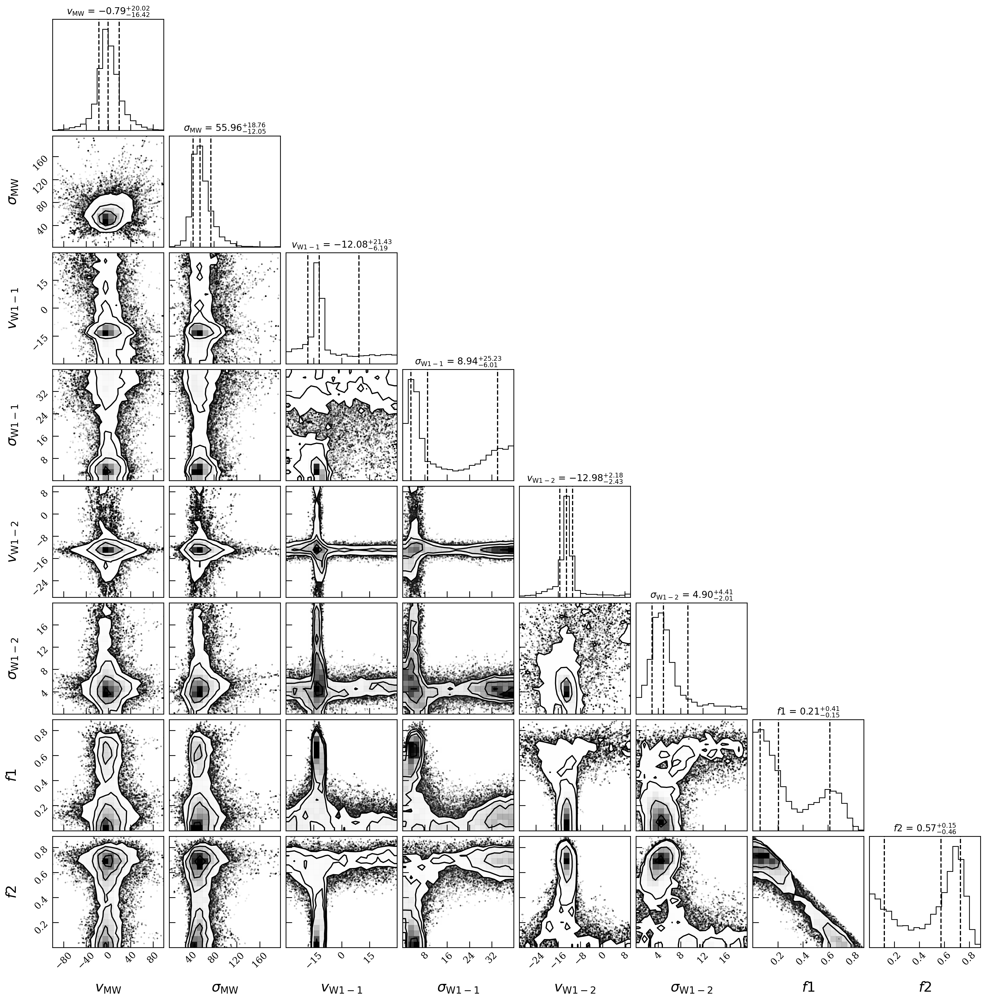

Posterior medians: {'$v_{\\rm MW}$': -0.7923623476411983, '$\\sigma_{\\rm MW}$': 55.964396664466435, '$v_{\\rm W1-1}$': -12.077486918823645, '$\\sigma_{\\rm W1-1}$': 8.941071860978411, '$v_{\\rm W1-2}$': -12.984520584636446, '$\\sigma_{\\rm W1-2}$': 4.9040992504193905, '$f1$': 0.20505896119580752, '$f2$': 0.5747631495711609}


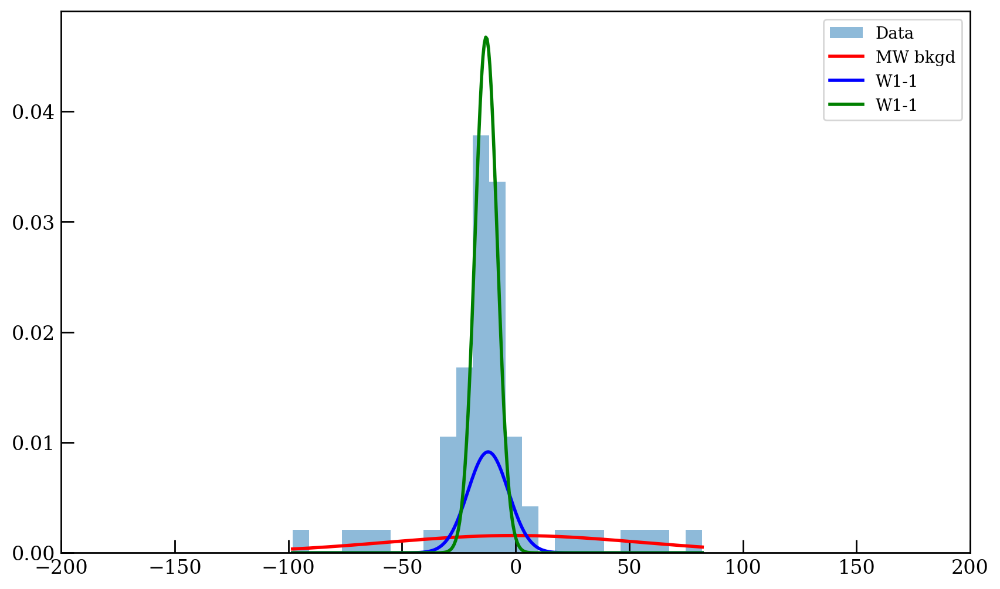

In [57]:
best = pu.plot_mixture_results3(samples, cut_deimos["v"], figname = "plots/test.pdf")

## trying different cuts

32
0.90625


  0%|          | 0/2000 [00:00<?, ?it/s]/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 2000/2000 [01:10<00:00, 28.50it/s]


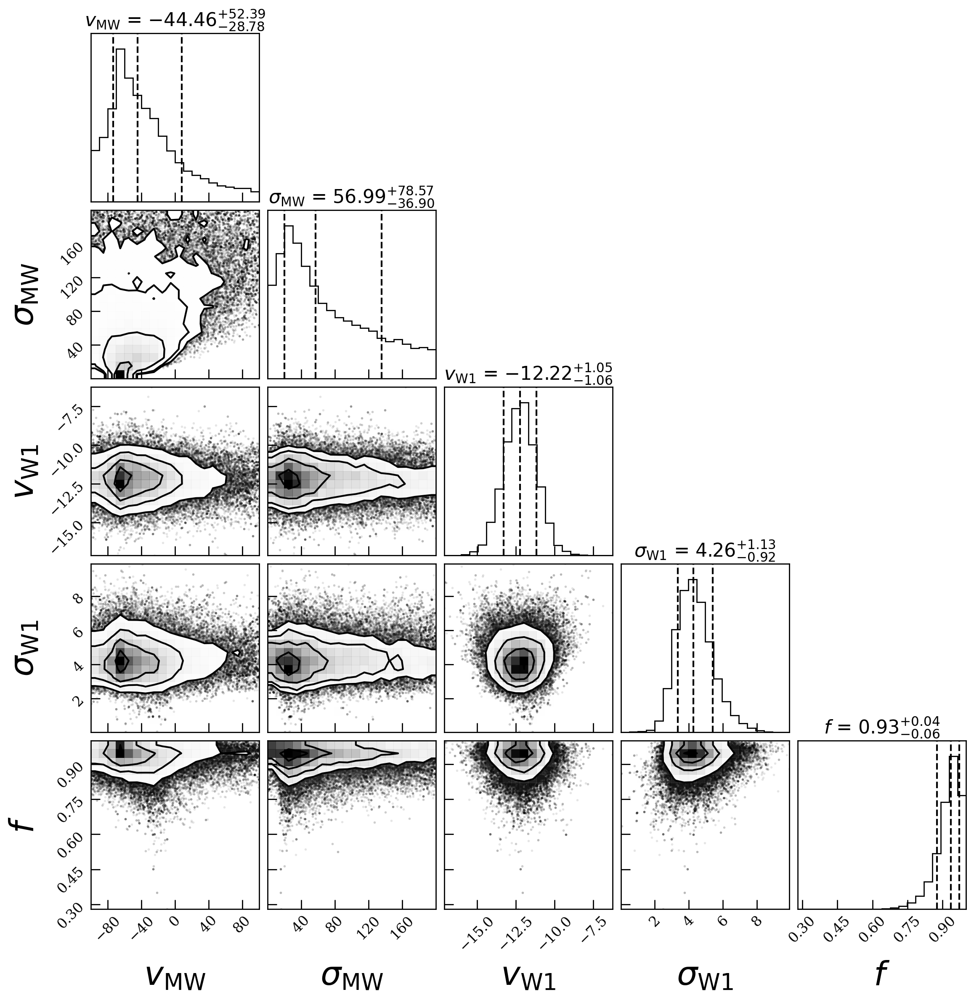

Posterior medians: {'$v_{\\rm MW}$': -44.46348066682281, '$\\sigma_{\\rm MW}$': 56.98736989055408, '$v_{\\rm W1}$': -12.217535266973458, '$\\sigma_{\\rm W1}$': 4.25738909024066, '$f$': 0.9348118680269182}


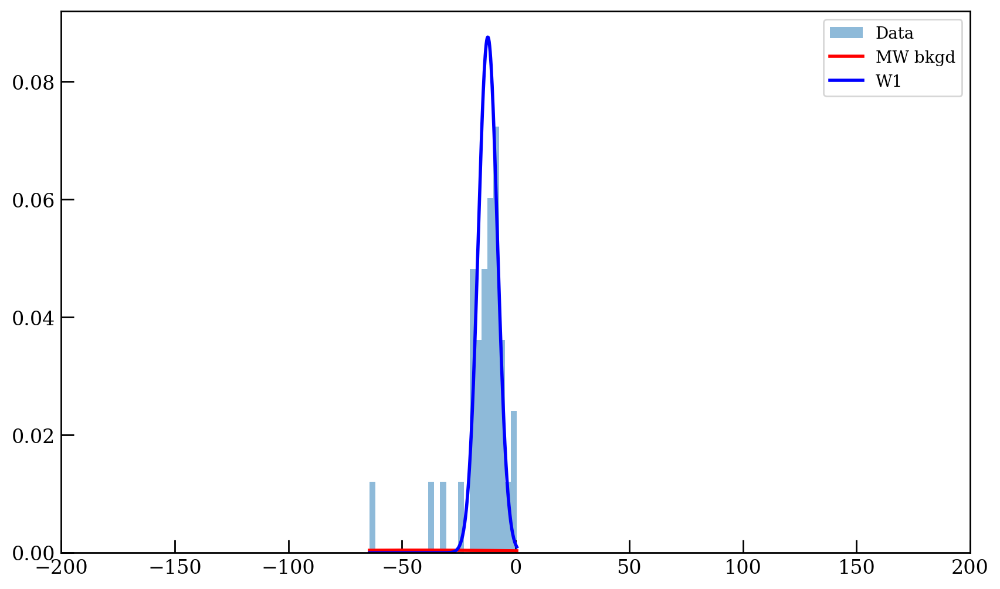

In [144]:
cut_deimos = deimos_data[(deimos_data["hl_radius_ell"] < 2) & (deimos_data["flag_var"] == 0) & (deimos_data["prob_nov"] > 0.5)]
nn = len(cut_deimos)
print(nn)
print(len(cut_deimos[cut_deimos["sample"] == 1]) / nn)
priors = {
    'mu1': (0, 25),
    'sig1': (50, 10),
    'mu2': (v_avg2011, 2),
    'sig2': (v_disp2011, 2),
    'f': (0.9, 0.1)
}

sampler, samples, v_mem, verr_mem, sig_mem, sigp_mem, sigm_mem = pu.mcmc_mixture(cut_deimos["v"], cut_deimos["v_err"], priors, nsteps=2000)
best = pu.plot_mixture_results(samples, cut_deimos["v"])


## strictly member sample

[27.58738382 29.69372499] 59 True
100 1


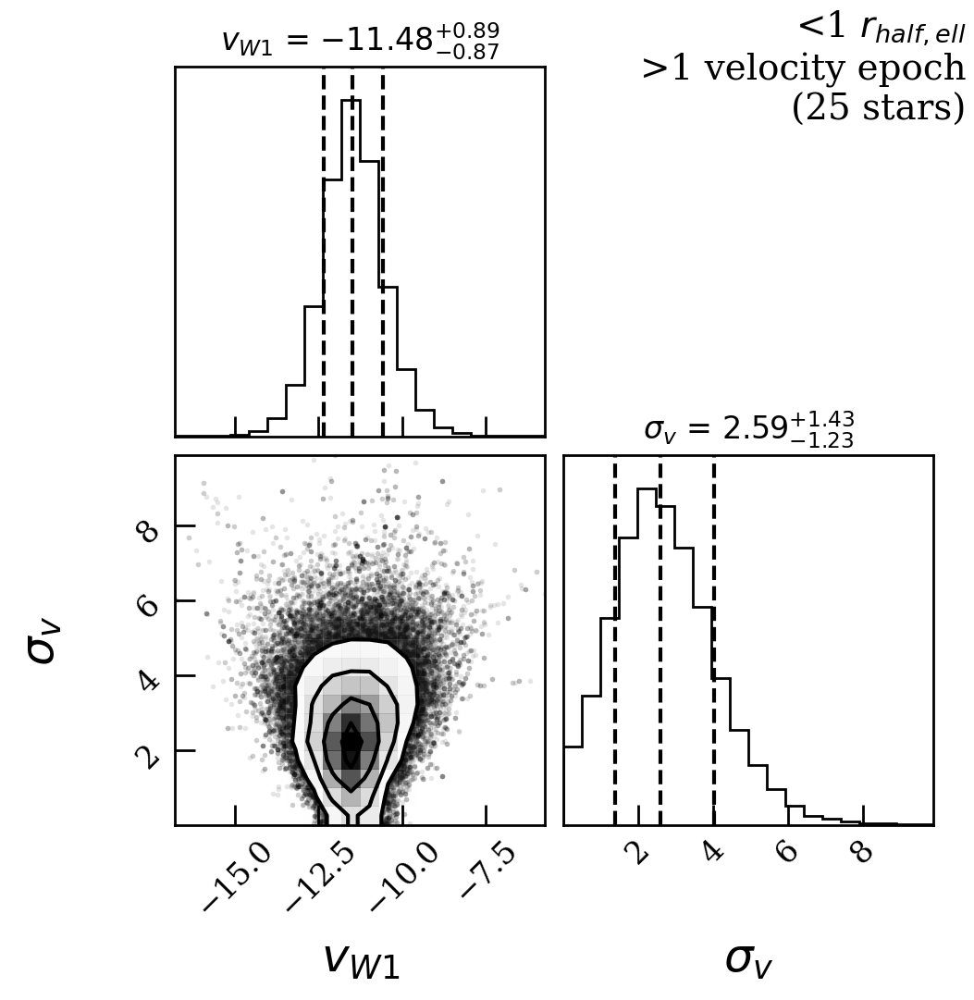

In [ ]:
# < 1rhalf
label_half, filename_half = "<1 $r_{half,ell}$\n>1 velocity epoch\n(" + str(len(rhalf_members)) + " stars)", "plots/vdisp_half.pdf"
v_half, verr_half, sig_half, sigp_half, sigm_half, samp1 = pu.calc_velocity(rhalf_members["v"].values, rhalf_members["v_err"].values, 
                                                                            v_avg2011, v_disp2011, label_half, filename_half)

[27.70449418 34.47168291] 68 True
100 1


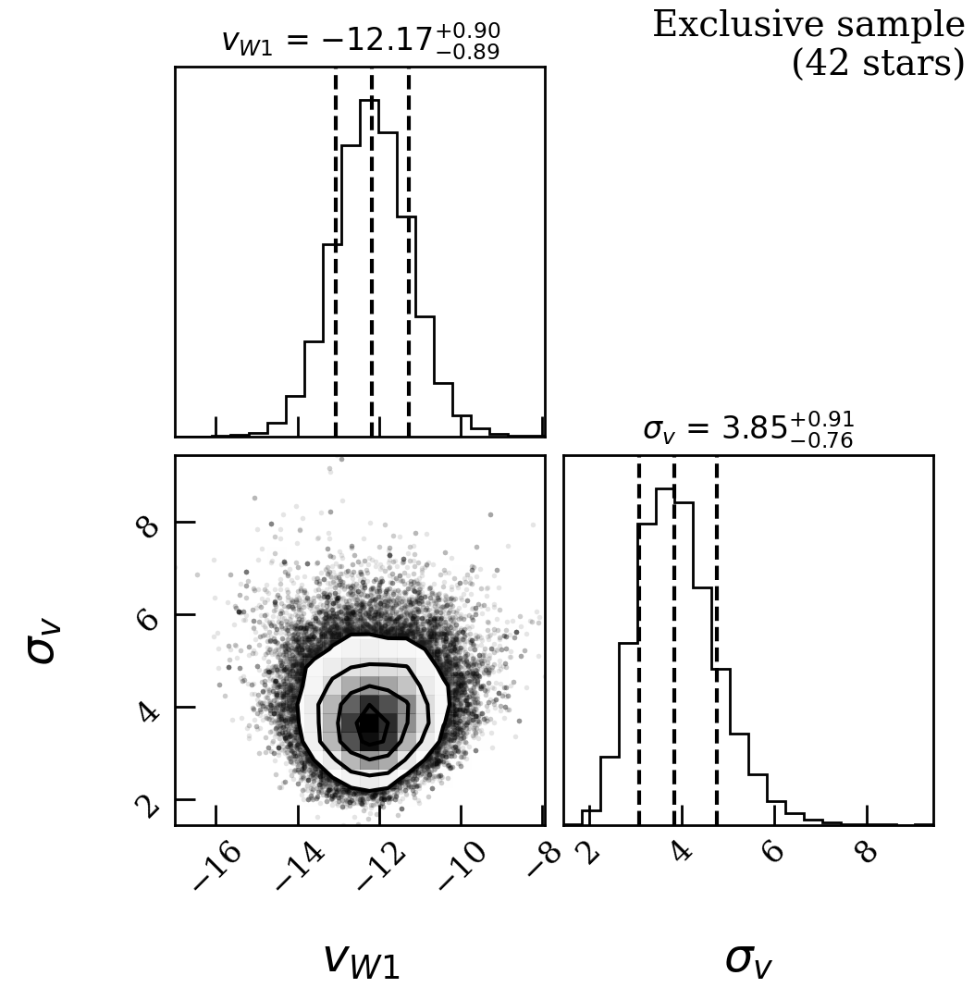

In [146]:
test = w1_members[(w1_members["hl_radius_ell"] <= 2) & (w1_members["flag_var"] != 1)]
label_ex, filename_ex = "Exclusive sample\n(" + str(len(test)) + " stars)", "plots/vdisp_exclusive.pdf"
v_ex, verr_ex, sig_ex, sigp_ex, sigm_ex, samp = pu.calc_velocity(test["v"].values, test["v_err"].values, 
                                                                 v_avg2011, v_disp2011, label_ex, filename_ex)

[29.37526891 32.35344893] 64 True
100 1


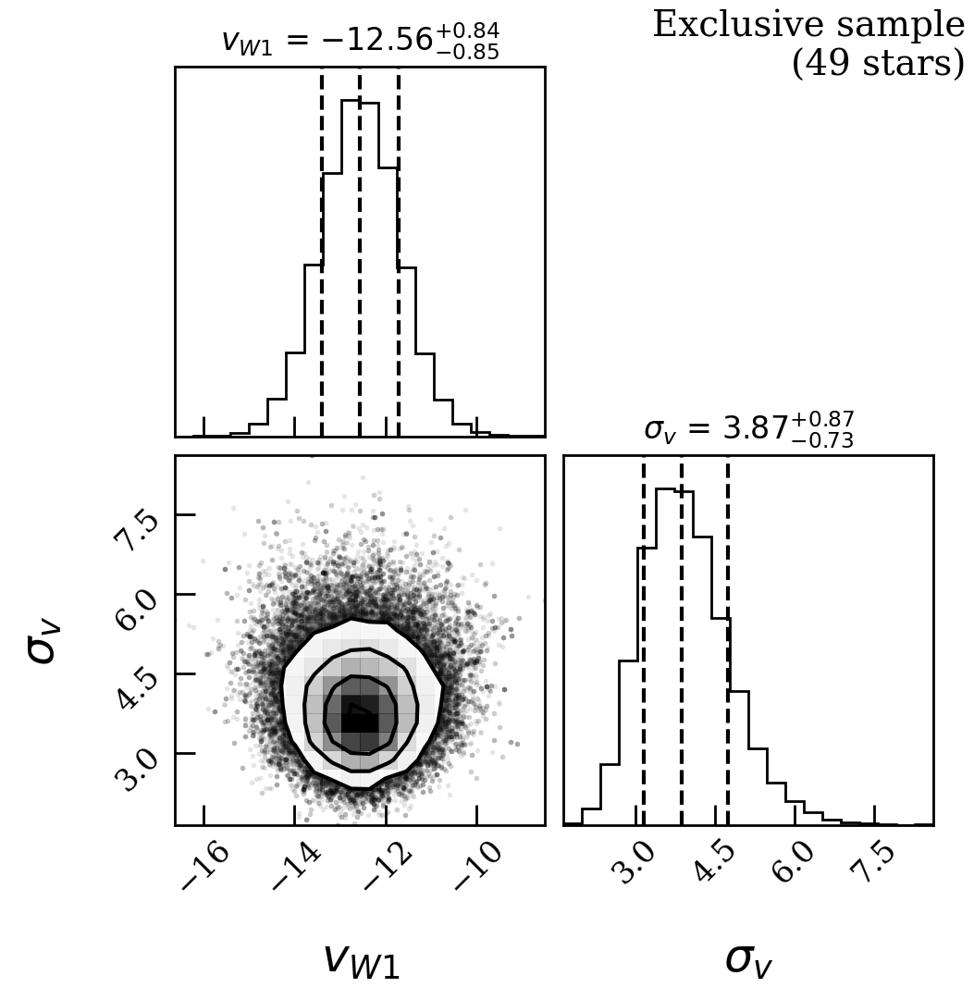

In [145]:
test = w1_members[(w1_members["hl_radius_ell"] <= 3) & (w1_members["flag_var"] != 1)]
label_ex, filename_ex = "Exclusive sample\n(" + str(len(test)) + " stars)", "plots/vdisp_exclusive.pdf"
v_ex, verr_ex, sig_ex, sigp_ex, sigm_ex, samp = pu.calc_velocity(test["v"].values, test["v_err"].values, 
                                                                 v_avg2011, v_disp2011, label_ex, filename_ex)

[32.71404864 30.81621214] 65 True
100 1


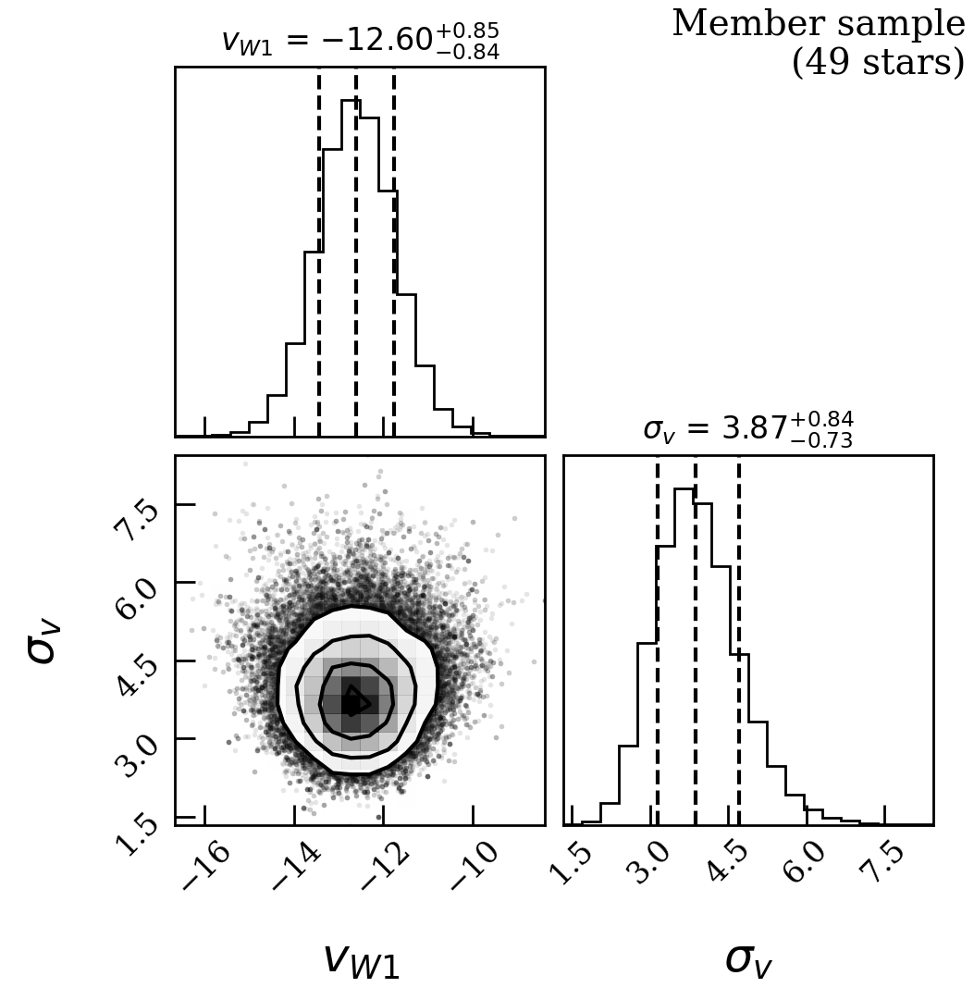

In [254]:
label_ex, filename_ex = "Member sample\n(" + str(len(w1_members)) + " stars)", "plots/vdisp_exclusive.pdf"
v_ex, verr_ex, sig_ex, sigp_ex, sigm_ex, samp = pu.calc_velocity(w1_members["v"], w1_members["v_err"], 
                                                                 v_avg2011, v_disp2011, label_ex, filename_ex)

In [ ]:
v_prior_test = np.random.uniform(v_avg2011 - 5, v_avg2011 + 5, 50)
vdisp_prior_test = np.random.uniform(v_disp2011 - 1, v_disp2011 + 1, 50)

vsys_test, vdisp_test = np.zeros((50)), np.zeros((50))

for ii in range(len(v_prior_test)):
    results = pu.calc_velocity(w1_members["v"], w1_members["v_err"], v_prior_test[ii], vdisp_prior_test[ii], 
                                label = "v = {:.2f}, vdisp = {:.2f}".format(v_prior_test[ii], vdisp_prior_test[ii]), figname = 0)
    vsys_test[ii], vdisp_test[ii] = results[0], results[2]
    if (abs(results[0] - v_ex) > verr_ex) | (abs(results[2] - sig_ex) > sigp_ex):
        print(v_prior_test[ii], vdisp_prior_test[ii])

## Proper motion

In [10]:
from wil1_properties import pmra_pace, pmra_err_pace, pmdec_pace, pmdec_err_pace

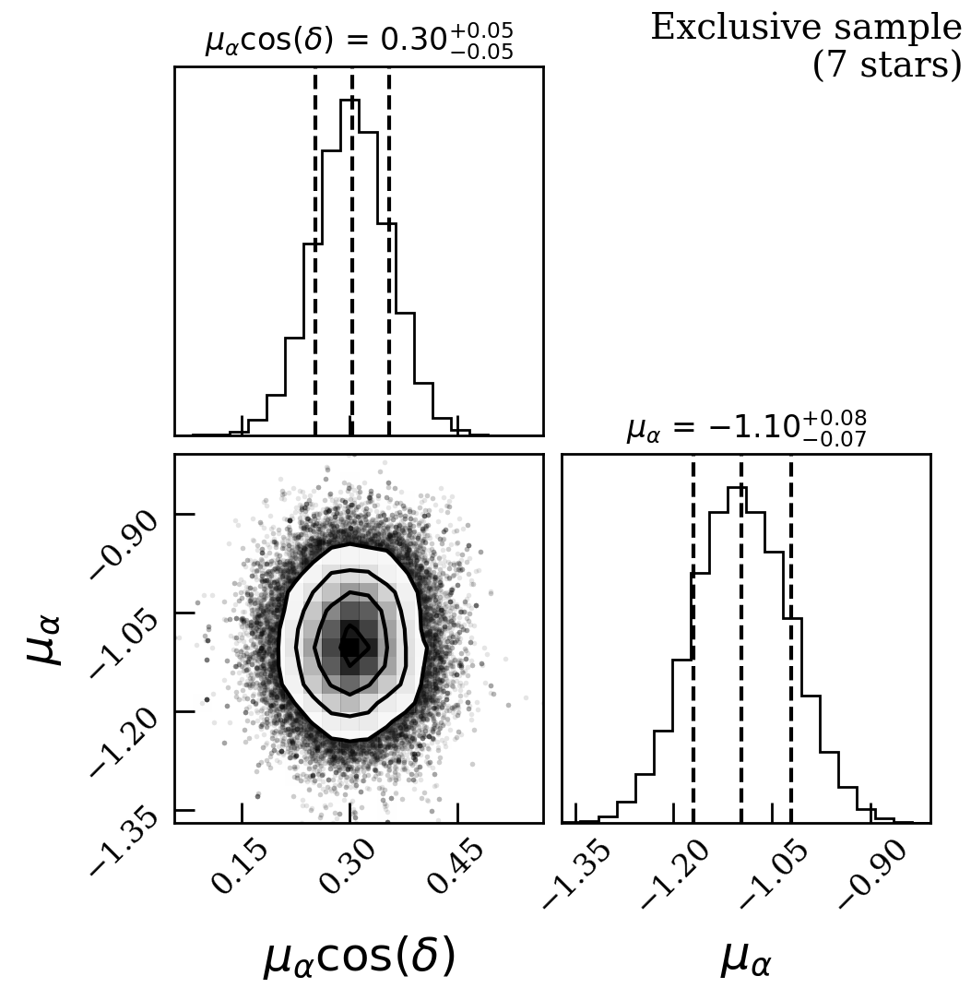

In [11]:
label1, filename1 = "Exclusive sample\n(" + str(len(gaia_members)) + " stars)", "plots/pm_mcmc.pdf"

w1_pmra, w1_pmra_err, w1_pmdec, w1_pmdec_err, samp = pu.calc_pm(gaia_members["gaia_pmra"], gaia_members["gaia_pmra_err"], 
                                                                gaia_members["gaia_pmdec"], gaia_members["gaia_pmdec_err"], 
                                                                pmra_pace, pmdec_pace, label1, filename1)
pu.save_variable("pmra_w1", [w1_pmra, w1_pmra_err])
pu.save_variable("pmdec_w1", [w1_pmdec, w1_pmdec_err])
pmra_w1 = [w1_pmra, w1_pmra_err]
pmdec_w1 = [w1_pmdec, w1_pmdec_err]

In [13]:
pmra_w1, pmdec_w1

([0.30350398138015605, 0.05087948259212696],
 [-1.0971768087861844, 0.07417568619696469])

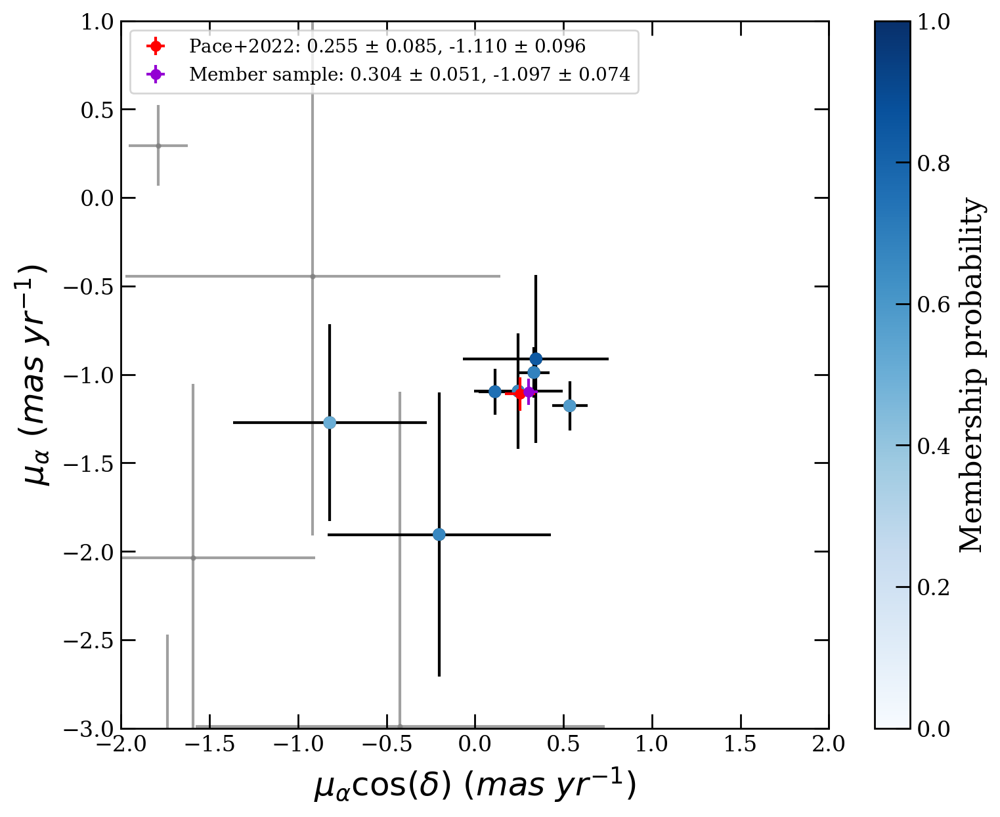

In [14]:
fig = plt.figure(figsize = (9, 7))
ax = fig.gca()
ax.set_aspect('equal', adjustable='box')

deimos_gaia = deimos_data[(deimos_data["gaia_pmra_err"] > 0) & (deimos_data["pm_err_flag"] == 0)]
plt.errorbar(deimos_gaia["gaia_pmra"], deimos_gaia["gaia_pmdec"], yerr = deimos_gaia["gaia_pmdec_err"], 
             xerr = deimos_gaia["gaia_pmra_err"], alpha = 0.75, c = "grey", fmt="o", ms = 2, zorder = 0)

plt.errorbar(gaia_members["gaia_pmra"], gaia_members["gaia_pmdec"], yerr = gaia_members["gaia_pmdec_err"], 
             xerr = gaia_members["gaia_pmra_err"], fmt="o", ms = 2, c = "black", zorder = 1)

data = ax.scatter(gaia_members["gaia_pmra"], gaia_members["gaia_pmdec"], edgecolor = "black", 
                  c = gaia_members["prob_member"], cmap = "Blues", vmin = 0, vmax = 1, zorder = 2)
data = ax.scatter(gaia_members["gaia_pmra"], gaia_members["gaia_pmdec"], 
                  c = gaia_members["prob_member"], cmap = "Blues", vmin = 0, vmax = 1, zorder = 2)

plt.errorbar(pmra_pace, pmdec_pace, yerr = pmdec_err_pace, xerr = pmra_err_pace, fmt = "o", c = "red", ms = 5, zorder = 3, 
             label = r"Pace+2022: {:.3f} $\pm$ {:.3f}, {:.3f} $\pm$ {:.3f}".format(pmra_pace, pmra_err_pace, pmdec_pace, pmdec_err_pace))
plt.errorbar(pmra_w1[0], pmdec_w1[0], yerr = pmdec_w1[1], xerr = pmra_w1[1], ms = 5, fmt = "o", c = "darkviolet", zorder = 3, 
             label = r"Member sample: {:.3f} $\pm$ {:.3f}, {:.3f} $\pm$ {:.3f}".format(pmra_w1[0], pmra_w1[1], pmdec_w1[0], pmdec_w1[1]))

ax.set_xlim(-2, 2)
ax.set_ylim(-3, 1)

ax.set_xlabel(r'$\mu_{\alpha} \cos(\delta)~(mas~yr^{-1})$', labelpad = 5, size = 18).set_color('black')
ax.set_ylabel(r'$\mu {}_{\alpha} ~(mas~yr^{-1})$', labelpad = 5, size = 18).set_color('black')

# ax.set_xticks(np.arange(-4, 5, 1), minor = False)
# ax.set_xticks(np.arange(-4, 4.25, 0.25), minor = True)
ax.tick_params(which = "major", axis = "x", direction = "in", size = 8, color = "black", top = True)
ax.tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

# ax.set_yticks(np.arange(-4, 5, 1), minor = False)
# ax.set_yticks(np.arange(-4, 4.25, 0.25), minor = True)
ax.tick_params(which = "major", axis = "y", direction = "in", size = 8, color = "black", right = True)
ax.tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

cbar = plt.colorbar(data)
cbar.set_label("Membership probability")

ax.legend(loc = "upper left", fontsize = 10, frameon = True)

# fig.savefig("sample_pm_plot.pdf", dpi = 600, transparent = True)

## Metallicity

In [ ]:
from wil1_properties import feh_avg_2011, feh_disp_2011

/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


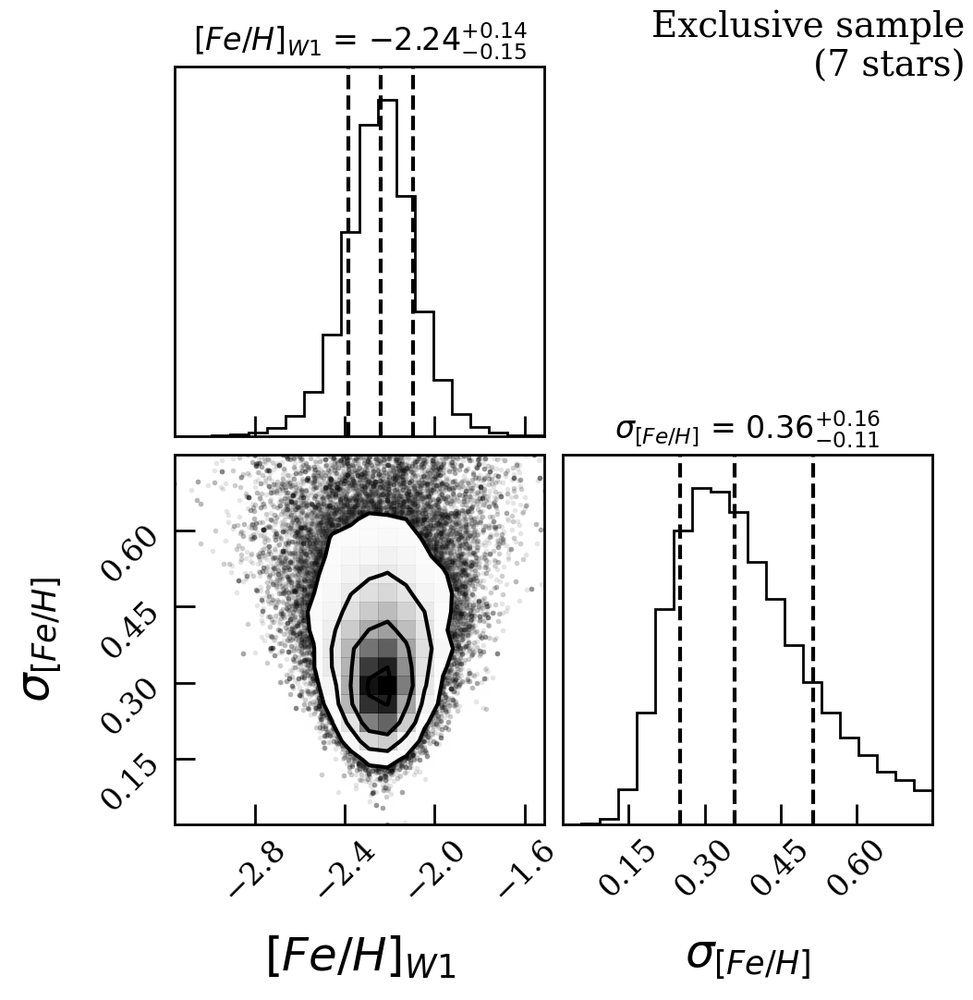

In [16]:
met_label, met_filename = "Exclusive sample\n(" + str(len(members_met)) + " stars)", "plots/met_mcmc_exclusive.pdf"
w1_met, w1_met_errm, w1_met_errp, w1_met_sigma, w1_met_sigma_errp, w1_met_sigma_errm, samp = pu.calc_metdisp(members_met["ew_feh"], members_met["ew_feh_err"], 
                                                                                                               feh_avg_2011, feh_disp_2011, 
                                                                                                               met_label, met_filename, plot = 1)
pu.save_variable("w1_met", [w1_met, w1_met_errp, w1_met_errm])
pu.save_variable("w1_met_sigma", [w1_met_sigma, w1_met_sigma_errp, w1_met_sigma_errm])

/var/folders/3k/btgj6dcd6rgc2_bxvvn6172h0000gn/T/ipykernel_11871/351283514.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_met["avg_met"] = np.nan
/var/folders/3k/btgj6dcd6rgc2_bxvvn6172h0000gn/T/ipykernel_11871/351283514.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_met["met_disp"] = np.nan
/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - s

102


/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/Users/camillechiu/opt/anaconda3/envs/astrowillman1/lib/python3.12/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar

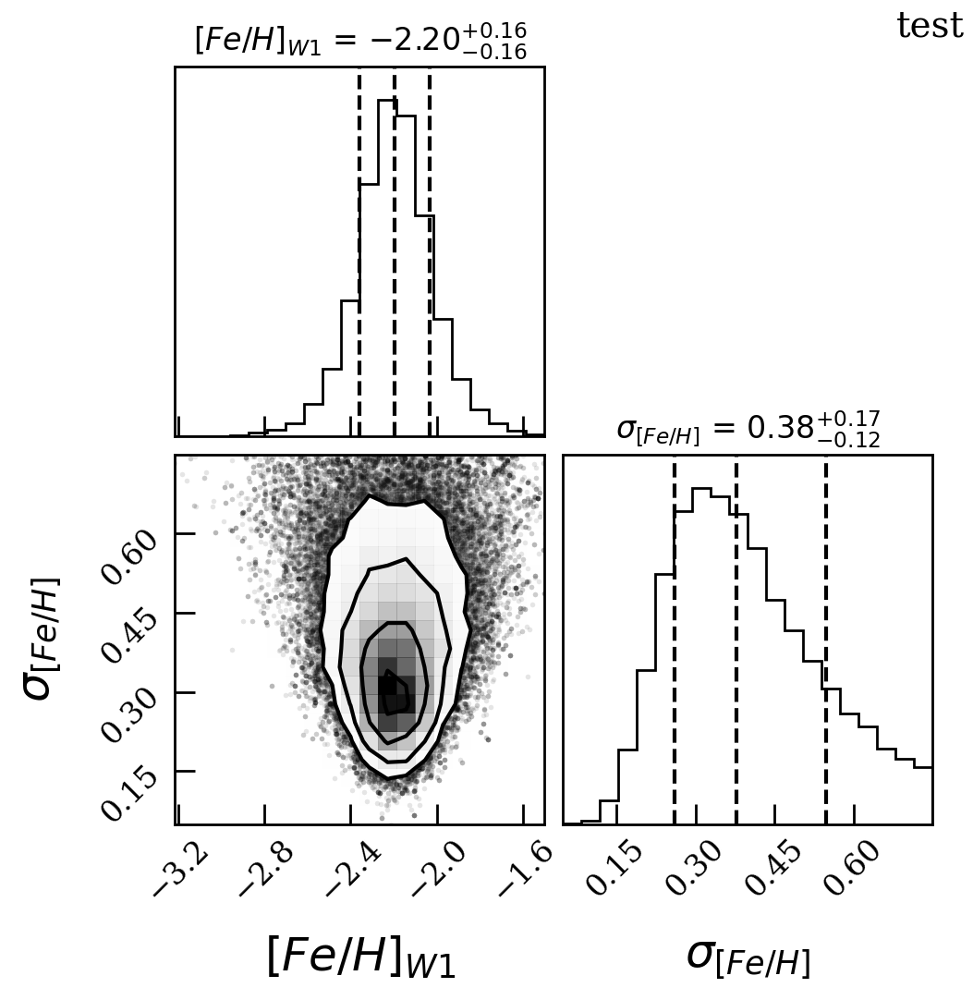

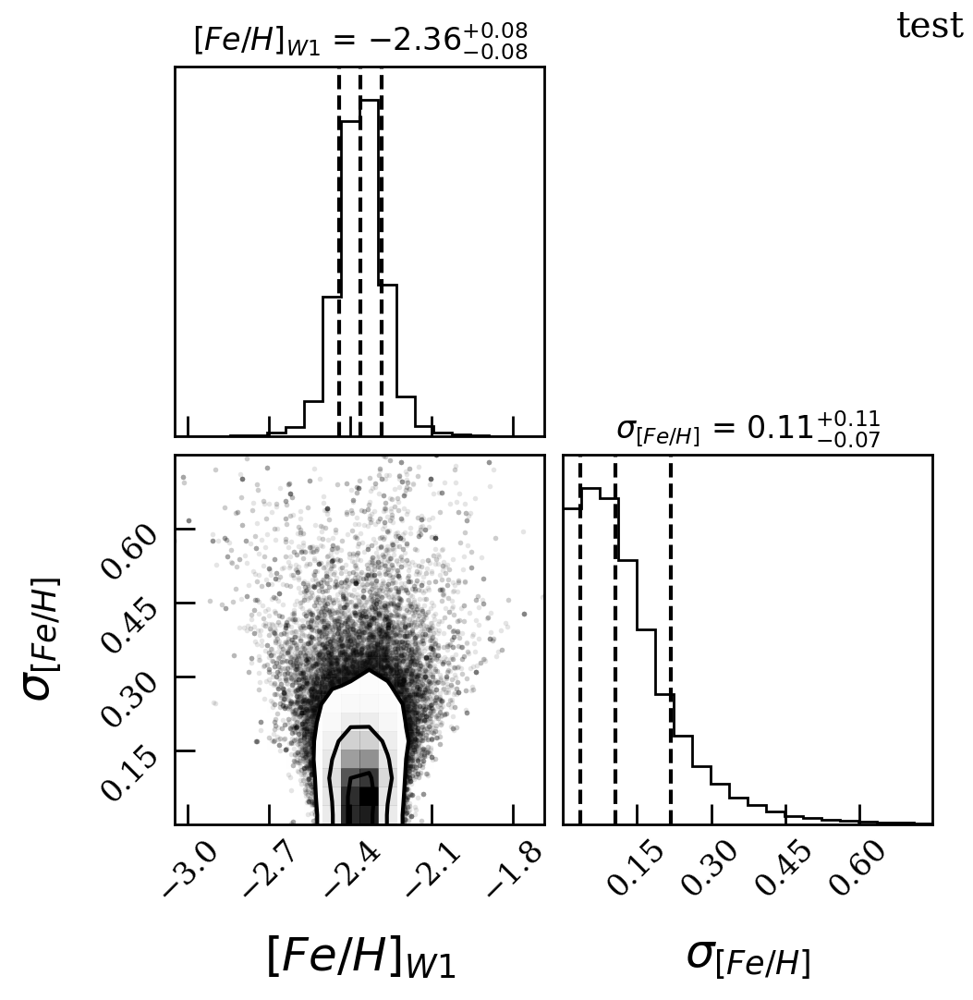

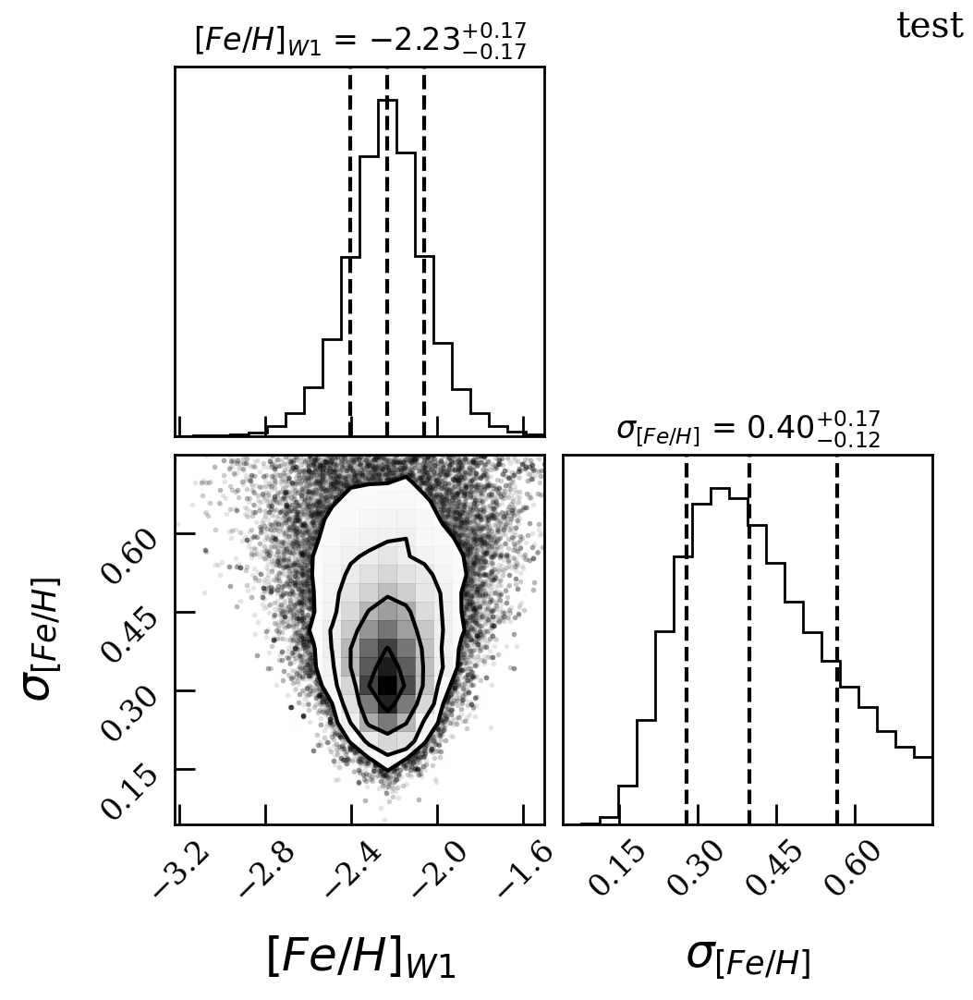

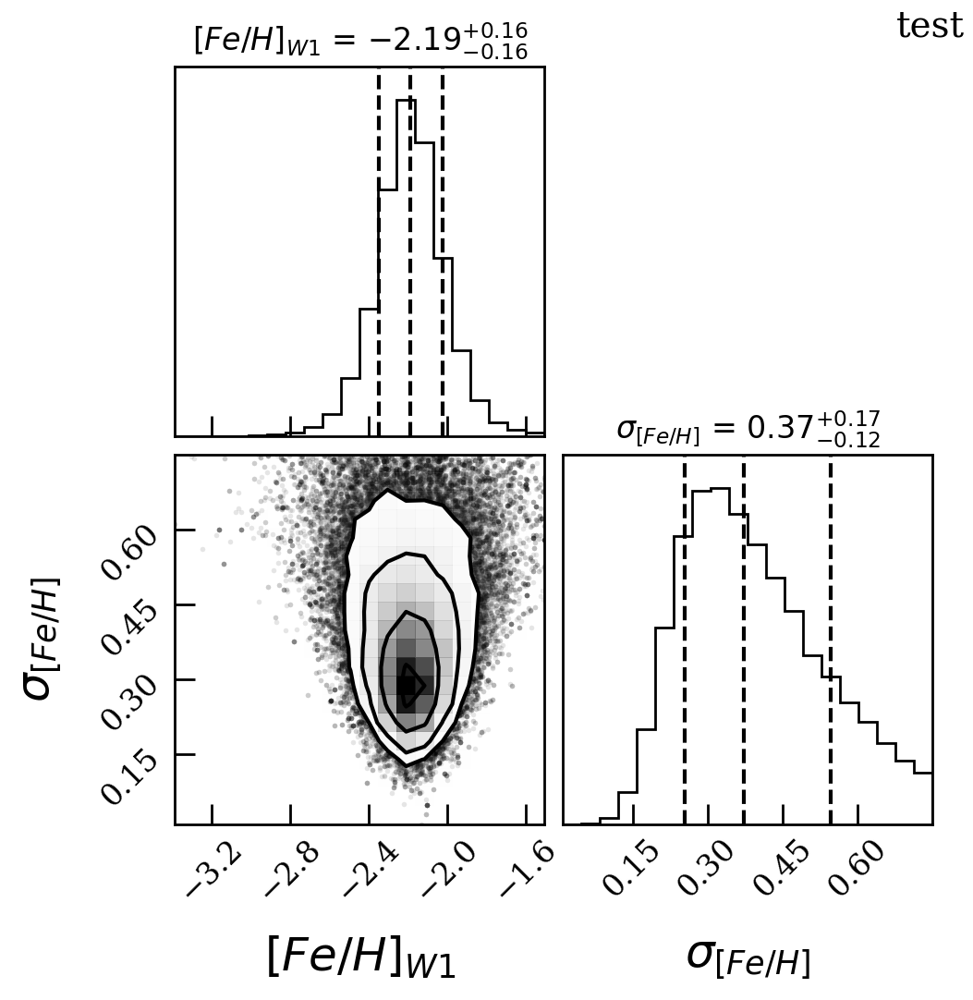

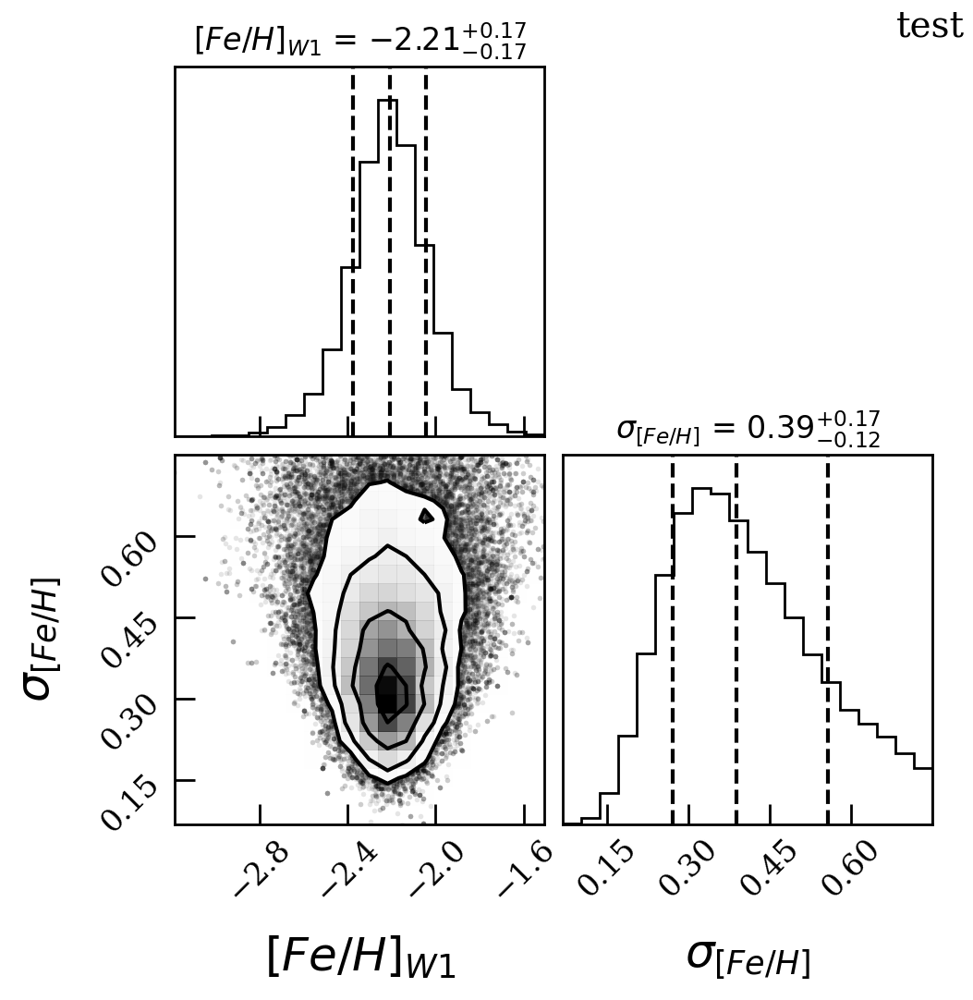

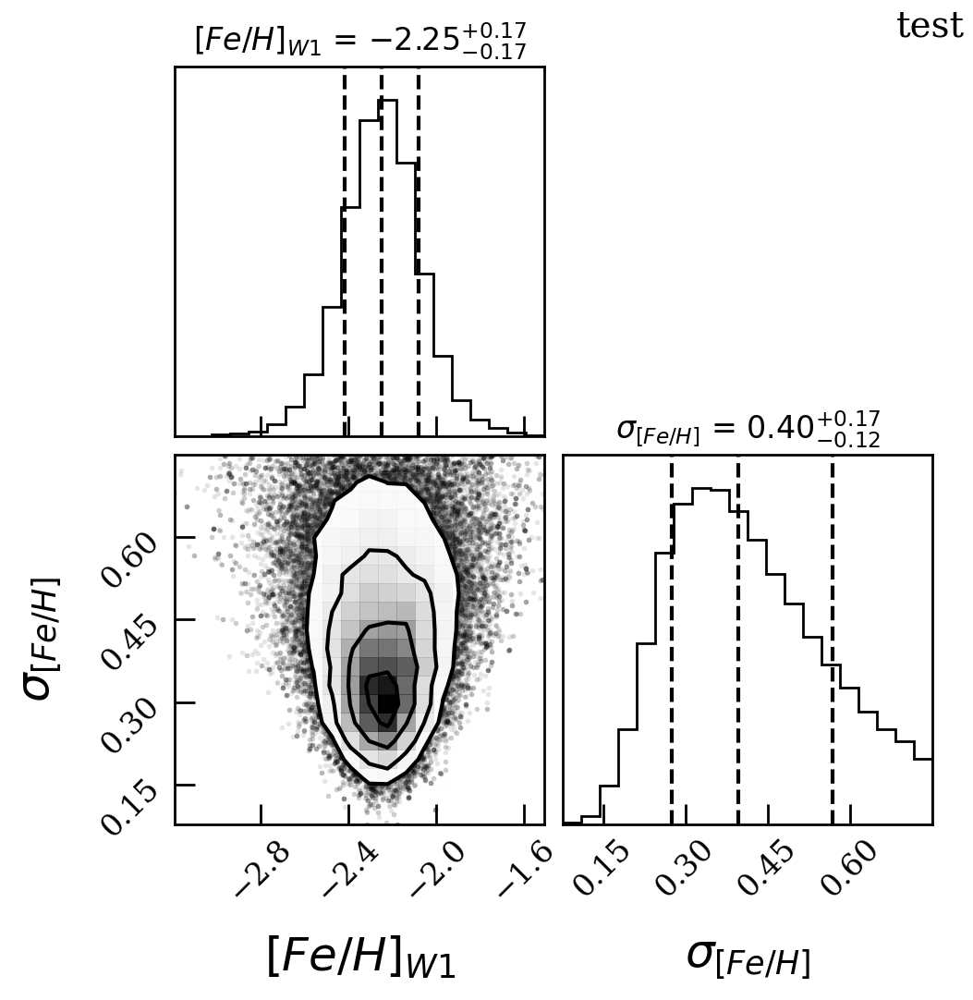

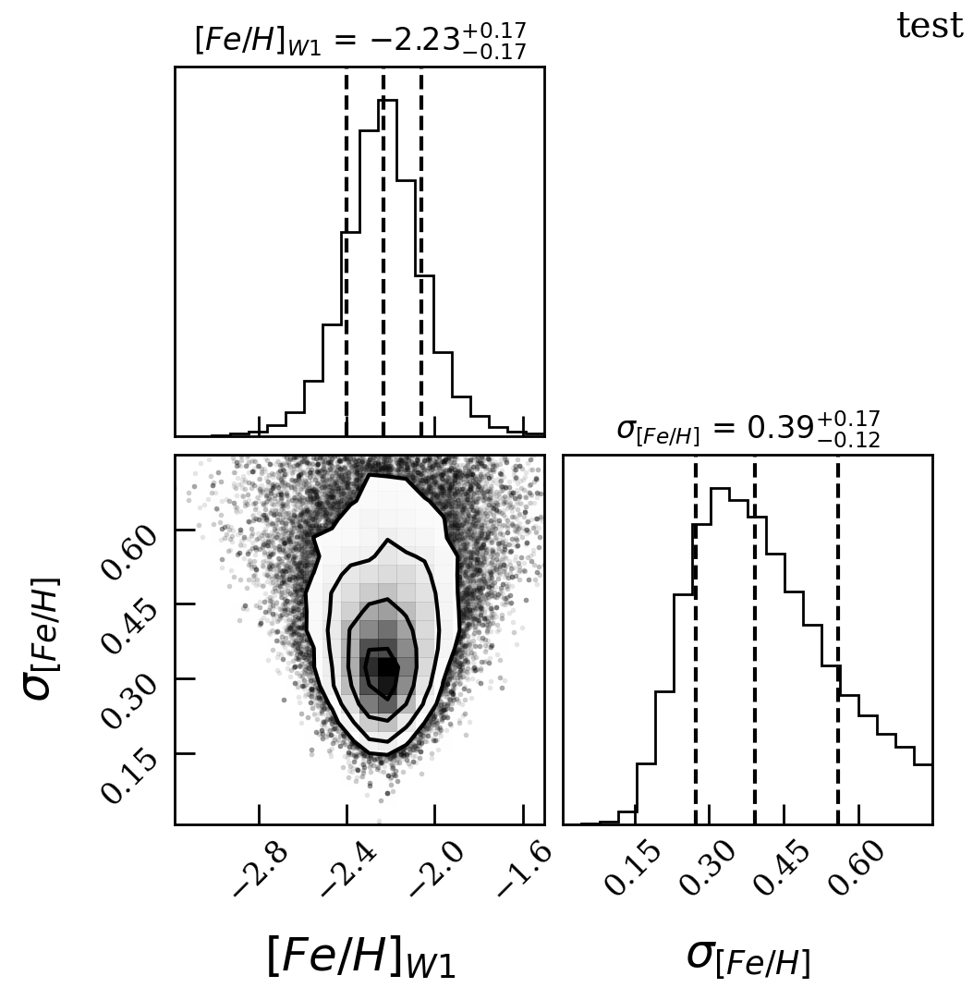

In [17]:
members_met["avg_met"] = np.nan
members_met["met_disp"] = np.nan

for ii in members_met.index.to_list():
    cut_sample = members_met.drop(index = [ii])
    results = pu.calc_metdisp(cut_sample["ew_feh"], cut_sample["ew_feh_err"], feh_avg_2011, feh_disp_2011, "test", "", plot = 1)
    members_met.loc[ii, "avg_met"], members_met.loc[ii, "met_disp"] = results[0], results[3]
    if (abs(results[0] - w1_met) > w1_met_errp) | (abs(results[3] - w1_met_sigma) > w1_met_sigma_errp):
        print(ii)

## FIGURE 5: Metallicity

In [18]:
def get_line(feh, ax, solid = False):
    # Carrera+13 fit
    a = -3.45
    b = 0.16
    c = 0.41
    d = -0.53
    e = 0.019

    g = a-feh
    
    cat_arr = np.arange(0.05,10,0.01)
    mag_arr = []
    
    for cat in cat_arr:
        
        h=c*cat
        j=d*cat**(-1.5)
        l=e*cat    
    
        mag = -1.*(g+h+j)/(b+l) 
        mag_arr = np.append(mag_arr,mag)
        
    mag = np.array(mag_arr)
    cat = np.array(cat_arr)

    # CALIBRATED REGION
    if solid == False:
        m1=mag_arr < 3
        ax.plot(mag[m1],cat[m1],c='#95150e', lw=2, zorder = 0, label = r"$[Fe/H]_{\rm W1} = $" + "${:.2f}$".format(w1_met[0]))

        m=mag_arr > 3
        ax.plot(mag[m],cat[m],ls=':',c='#95150e',lw=2, zorder = 0)
        
    if solid == True:
        if feh > feh_avg_2011:
            ax.plot(mag,cat,c='#95150e',ls=':', zorder = 0, label = r"$\sigma_{\rm [Fe/H]} = $" + "${:.2f}$".format(w1_met_sigma[0]) + " dex")
        else: 
            ax.plot(mag,cat,c='#95150e',ls=':', zorder = 0)

    return ax

In [21]:
from wil1_properties import w1_met, w1_met_sigma

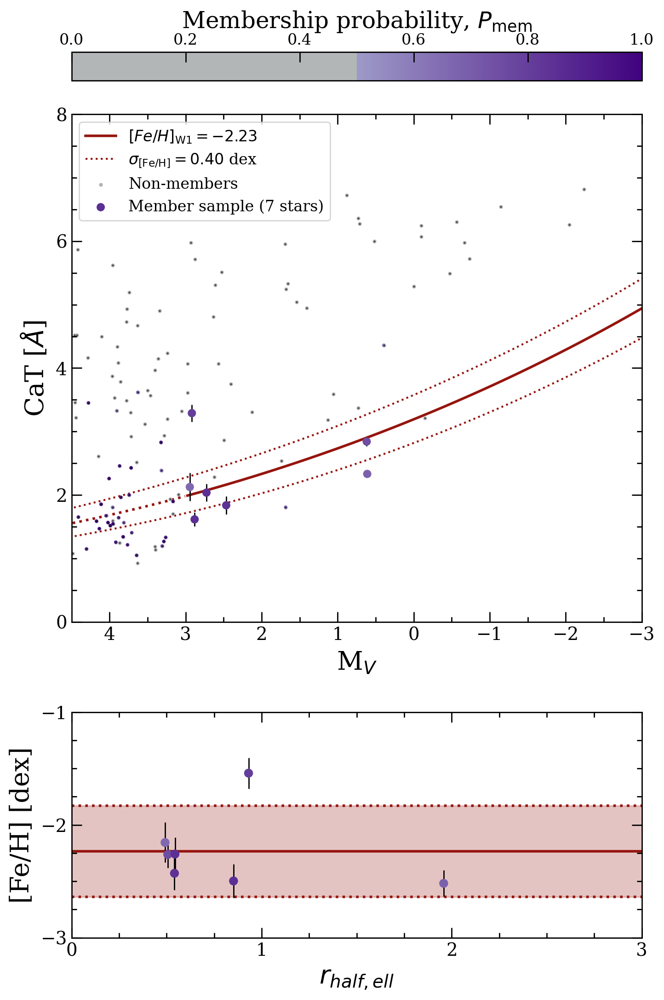

In [24]:
fig, axes = plt.subplots(2, 1, figsize = (8, 14), gridspec_kw={"height_ratios": [3, 1]}) #wspace, hspace
plt.subplots_adjust(hspace = 0.2) 

### CaT HISTOGRAM ###
m = (deimos_data['ew_cat_err'] > 0) & (deimos_data['ew_cat_err'] < 3) & (deimos_data['flag_HB'] != 1) & (deimos_data["hl_radius_ell"] <= 6) & (~blue_straggler)
d = deimos_data[m]

m1 = (d['sample'] == 1) & (d['MV_o'] < 3.) & (d['tmpl_teff'] < 6500)
m2 = (d['sample'] > 0)

axes[0] = get_line(w1_met[0], axes[0], solid = False)
axes[0] = get_line(w1_met[0]+w1_met_sigma[1], axes[0], solid = True)
axes[0] = get_line(w1_met[0]-w1_met_sigma[1], axes[0], solid = True)

axes[0].errorbar(d['MV_o'][m1&m2],d['ew_cat'][m1&m2], yerr=d['ew_cat_err'][m1&m2], 
                 fmt='None', c='black', elinewidth=1, zorder = 0)

axes[0].scatter(d['MV_o'], d['ew_cat'], c = "#B3B6B7", s = 4, label = "Non-members")
axes[0].scatter(d['MV_o'][m2], d['ew_cat'][m2], c = d['prob_member'][m2], s=3, cmap = new_purple_cmap, vmin=0, vmax=1)
axes[0].scatter(d['MV_o'][m1], d['ew_cat'][m1], c = d['prob_member'][m1], s=30, cmap = new_purple_cmap, vmin=0, vmax=1, label = "Member sample ({} stars)".format(len(members_met)))
                    
axes[0].plot(d['MV_o'][~m1], d['ew_cat'][~m1],'.k',alpha=0.6,ms=1)

axes[0].set_xticks(np.arange(-3, 4.5, 1), minor = False)
axes[0].set_xticks(np.arange(-3, 4.5, 0.5), minor = True)
axes[0].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[0].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0].set_yticks(np.arange(0, 10, 2), minor = False) #y ticks
axes[0].set_yticks(np.arange(0, 10, 0.5), minor = True)
axes[0].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[0].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[0].set_xlabel(r'M$_V$', labelpad = 5, size = 20).set_color('black')
axes[0].set_ylabel(r'CaT [$\AA$]', labelpad = 5, size = 20).set_color('black')
axes[0].set_xlim(4.5, -3)
axes[0].set_ylim(0, 8)

### SCATTER
axes[1].axhline(y = w1_met[0], color = '#95150e', lw=2, zorder = 0)
axes[1].axhline(y = w1_met[0] - w1_met_sigma[0], color = '#95150e', lw=2, ls = ":", zorder = 0)
axes[1].axhline(y = w1_met[0] + w1_met_sigma[0], color = '#95150e', lw=2, ls = ":", zorder = 0)
axes[1].fill_between(x = [0, 6], y1 = w1_met[0] - w1_met_sigma[0], y2 = w1_met[0] + w1_met_sigma[0], color = '#95150e', alpha = 0.25, zorder = 0)

axes[1].errorbar(members_met["hl_radius_ell"], members_met["ew_feh"], yerr = members_met["ew_feh_err"], fmt = "o", c = "#69359c", 
                 ecolor = "black", elinewidth = 1, ms = 4, zorder = 2, label = "Member sample")
d = axes[1].scatter(members_met["hl_radius_ell"], members_met["ew_feh"], c = members_met["prob_member"], 
                    cmap = new_purple_cmap, vmin = 0, vmax = 1, zorder = 3)

axes[1].set_xlabel(r"$r_{half,ell}$", labelpad = 5, size = 20).set_color('black')
axes[1].set_ylabel("[Fe/H] [dex]", labelpad = 5, size = 20).set_color('black')

axes[1].set_xticks(np.arange(0, 7, 1), minor = False) #x ticks
axes[1].set_xticks(np.arange(0, 6.25, 0.25), minor = True)
axes[1].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[1].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1].set_yticks(np.arange(-4, 3, 1), minor = False) #y ticks
axes[1].set_yticks(np.arange(-4, 2.25, 0.25), minor = True)
axes[1].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[1].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[1].set_xlim(0, 3)
axes[1].set_ylim(-3, -1)

cbar = plt.colorbar(d, fraction = 0.2, ax = axes[0], location = "top")
cbar.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 18)

axes[0].legend(loc = "upper left", fontsize = 12, frameon = True)

fig.savefig("plots/5_metallicity.pdf", dpi = 600, transparent = True)

## FIGURE 1: Membership

In [25]:
# alter color bar
thresh = 0.1000000
nodes = [0, thresh, thresh, 1.0]

# purple
orig_cmap_purp = plt.colormaps["Purples"]
colors_purp = ["#B3B6B7", "#B3B6B7", orig_cmap_purp(0.3), orig_cmap_purp(0.99)]
new_cmap_purple = matplotlib.colors.LinearSegmentedColormap.from_list("", list(zip(nodes, colors_purp)))

# red
orig_cmap_red = plt.colormaps["Reds"]
colors_red = ["#B3B6B7", "#B3B6B7", orig_cmap_red(0.3), orig_cmap_red(0.99)]
new_cmap_red = matplotlib.colors.LinearSegmentedColormap.from_list("", list(zip(nodes, colors_red)))

# orange
orig_cmap_orange = plt.colormaps["Oranges"]
colors_orange = ["#B3B6B7", "#B3B6B7", orig_cmap_orange(0.3), orig_cmap_orange(0.99)]
new_cmap_orange = matplotlib.colors.LinearSegmentedColormap.from_list("", list(zip(nodes, colors_orange)))

# green
orig_cmap_green = plt.colormaps["Greens"]
colors_green = ["#B3B6B7", "#B3B6B7", orig_cmap_green(0.3), orig_cmap_green(0.99)]
new_cmap_green = matplotlib.colors.LinearSegmentedColormap.from_list("", list(zip(nodes, colors_green)))

# blue
orig_cmap_blue = plt.colormaps["Blues"]
colors_blue = ["#B3B6B7", "#B3B6B7", orig_cmap_blue(0.3), orig_cmap_blue(0.99)]
new_cmap_blue = matplotlib.colors.LinearSegmentedColormap.from_list("", list(zip(nodes, colors_blue)))

In [26]:
cmd_member = deimos_data[(deimos_data["cmd_marker"] > 0.1)]
cmd_nonmember = deimos_data[(deimos_data["cmd_marker"] <= 0.1)]

v_member = deimos_data[deimos_data["v_marker"] > 0.1]
v_nonmember = deimos_data[deimos_data["v_marker"] <= 0.1]

pm_member = deimos_data[(deimos_data["pm_marker"] > 0.1) & (deimos_data["gaia_pmdec_err"] > 0.) & (deimos_data["pm_err_flag"] == 0)]
pm_nonmember = deimos_data[(deimos_data["pm_marker"] <= 0.1) & (deimos_data["gaia_pmdec_err"] > 0.) & (deimos_data["pm_err_flag"] == 0)]

feh_member = deimos_data[deimos_data["feh_marker"] > 0.1]
feh_nonmember = deimos_data[deimos_data["feh_marker"] <= 0.1]

cmd_member2 = deimos_data[(deimos_data["prob_member"] > 0.1)]
cmd_nonmember2 = deimos_data[(deimos_data["prob_member"] <= 0.1)]

v_member2 = deimos_data[deimos_data["prob_member"] > 0.1]
v_nonmember2 = deimos_data[deimos_data["prob_member"] <= 0.1]

pm_member2 = deimos_data[(deimos_data["prob_member"] > 0.1) & (deimos_data["gaia_pmdec_err"] > 0.) & (deimos_data["pm_err_flag"] == 0)]
pm_nonmember2 = deimos_data[(deimos_data["prob_member"] <= 0.1) & (deimos_data["gaia_pmdec_err"] > 0.) & (deimos_data["pm_err_flag"] == 0)]

feh_member2 = deimos_data[deimos_data["prob_member"] > 0.1]
feh_nonmember2 = deimos_data[deimos_data["prob_member"] <= 0.1]

variable = deimos_data[deimos_data["flag_var"] == 1]

In [29]:
from importlib import reload
reload(wil1_properties)
from wil1_properties import pmra_w1, pmdec_w1, vsys, vdisp, feh_avg_2011, w1_met, w1_met_sigma, v_avg2011, v_disp2011

<>:218: SyntaxWarning: invalid escape sequence '\m'
<>:219: SyntaxWarning: invalid escape sequence '\m'
<>:218: SyntaxWarning: invalid escape sequence '\m'
<>:219: SyntaxWarning: invalid escape sequence '\m'
/var/folders/3k/btgj6dcd6rgc2_bxvvn6172h0000gn/T/ipykernel_11871/4011876663.py:218: SyntaxWarning: invalid escape sequence '\m'
  label = "$\mu_\\alpha \cos \delta = {:.3f} \pm {:.3f}$".format(pmra_w1[0], pmra_w1[1]) + r" mas yr$^{-1}$" +
/var/folders/3k/btgj6dcd6rgc2_bxvvn6172h0000gn/T/ipykernel_11871/4011876663.py:219: SyntaxWarning: invalid escape sequence '\m'
  "\n $\mu_\delta = {:.3f} \pm {:.3f}$".format(pmdec_w1[0], pmdec_w1[1]) + r" mas yr$^{-1}$")


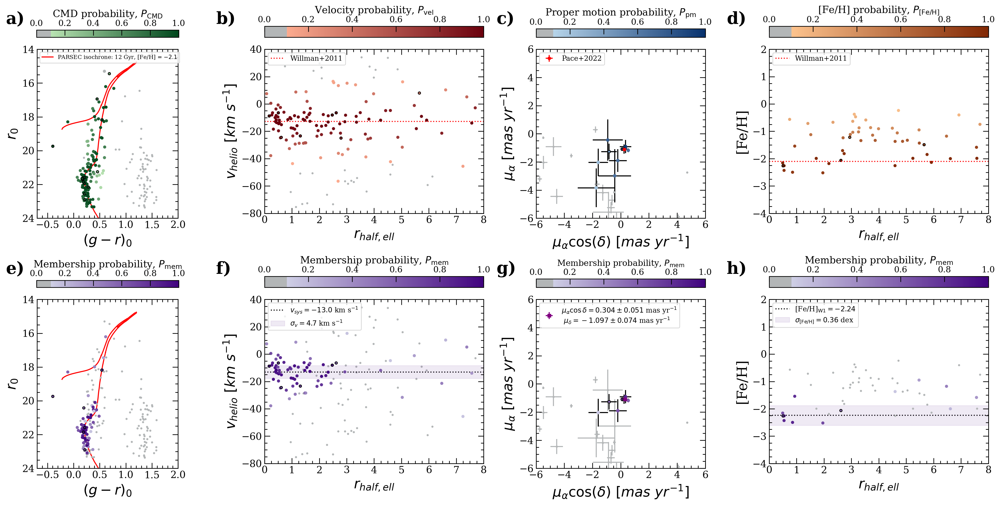

In [30]:
fig, axes = plt.subplots(2, 4, figsize = (20, 10), constrained_layout = True)

#### MEMBERSHIP -- CMD plot ###
axes[0][0].set_box_aspect(1.2)

axes[0][0].plot(gr_iso[0:114], r_iso[0:114], c = "red", label = "PARSEC isochrone: 12 Gyr, [Fe/H] = $-2.1$", zorder = 0)
axes[0][0].plot(gr_iso[114:200], r_iso[114:200], c = "red", zorder = 0)

axes[0][0].scatter(cmd_nonmember["gmag_o"]-cmd_nonmember["rmag_o"], cmd_nonmember["rmag_o"], c = "#B3B6B7", s = 4, zorder = 1)
cmddata = axes[0][0].scatter(cmd_member["gmag_o"] - cmd_member["rmag_o"], cmd_member["rmag_o"], c = cmd_member["cmd_marker"], 
                             cmap = new_cmap_green, s = 12, vmin = 0, vmax = 1, zorder = 2)
cmddata = axes[0][0].scatter(cmd_member[cmd_member["flag_var"] == 1]["gmag_o"] - cmd_member[cmd_member["flag_var"] == 1]["rmag_o"], cmd_member[cmd_member["flag_var"] == 1]["rmag_o"], c = cmd_member[cmd_member["flag_var"] == 1]["cmd_marker"], 
                             cmap = new_cmap_green, edgecolor = "black", s = 12, vmin = 0, vmax = 1, zorder = 3)

axes[0][0].set_xlabel("$(g-r)_0$", labelpad = 5, size = 20).set_color('black')
axes[0][0].set_ylabel("$r_0$", labelpad = 5, size = 20).set_color('black')

axes[0][0].set_xticks(np.arange(-0.5, 2.5, 0.5), minor = False)
axes[0][0].set_xticks(np.arange(-0.7, 2.1, 0.1), minor = True)
axes[0][0].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[0][0].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0][0].set_yticks(np.arange(14, 26, 2), minor = False)
axes[0][0].set_yticks(np.arange(14, 25.5, 0.5), minor = True)
axes[0][0].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[0][0].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

cbar00 = plt.colorbar(cmddata, fraction = 0.042, ax = axes[0][0], location = "top")
cbar00.set_label(r"CMD probability, $P_{\rm CMD}$", fontsize = 14)

axes[0][0].set_xlim(-0.7, 2)
axes[0][0].set_ylim(24, 14)

axes[0][0].legend(loc = "upper left", fontsize = 8)

### MEMBERSHIP -- VELOCITY ###
axes[0][1].set_aspect(0.05)

axes[0][1].scatter(v_nonmember["hl_radius_ell"], v_nonmember["v"], c = "#B3B6B7", s = 4, zorder = 0)
vdata = axes[0][1].scatter(v_member["hl_radius_ell"], v_member["v"], c = v_member["v_marker"], 
                           s = 12, cmap = new_cmap_red, vmin = 0, vmax = 1, zorder = 2)
vdata = axes[0][1].scatter(v_member[v_member["flag_var"] == 1]["hl_radius_ell"], v_member[v_member["flag_var"] == 1]["v"], c = v_member[v_member["flag_var"] == 1]["v_marker"], edgecolor = "black",
                           s = 12, cmap = new_cmap_red, vmin = 0, vmax = 1, zorder = 3)

axes[0][1].axhline(y = v_avg2011, linestyle = ":", c = "r", zorder = 1, label = "Willman+2011")

axes[0][1].set_xlim(0, 7)
axes[0][1].set_ylim(-80, 40)

axes[0][1].set_xlabel("$r_{half, ell}$", labelpad = 5, size = 20).set_color('black')
axes[0][1].set_ylabel("$v_{helio}~[km~s^{-1}]$", labelpad = 5, size = 20).set_color('black')

axes[0][1].set_xticks(np.arange(0, 9, 1), minor = False)
axes[0][1].set_xticks(np.arange(0, 8.25, 0.25), minor = True)
axes[0][1].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[0][1].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0][1].set_yticks(np.arange(-80, 60, 20), minor = False)
axes[0][1].set_yticks(np.arange(-80, 45, 5), minor = True)
axes[0][1].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[0][1].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[0][1].legend(loc = "upper left", fontsize = 10)

cbar01 = plt.colorbar(vdata, ax = axes[0][1], location = "top")
cbar01.set_label(r"Velocity probability, $P_{\rm vel}$", fontsize = 14)

### MEMBERSHIP -- PROPER MOTION ###
axes[0][2].set_aspect('equal', adjustable='box')

axes[0][2].errorbar(pm_nonmember["gaia_pmra"], pm_nonmember["gaia_pmdec"], yerr = pm_nonmember["gaia_pmdec_err"], 
                    xerr = pm_nonmember["gaia_pmra_err"], fmt = "o", color = "#B3B6B7", ms = 2, zorder = 0)
axes[0][2].errorbar(pm_member["gaia_pmra"], pm_member["gaia_pmdec"], yerr = pm_member["gaia_pmdec_err"], xerr = pm_member["gaia_pmra_err"], 
                    fmt = "o", c = "black", ms = 2, zorder = 1)

axes[0][2].scatter(pm_nonmember["gaia_pmra"], pm_nonmember["gaia_pmdec"], c = "#B3B6B7", s = 4, zorder = 2)
pmdata = axes[0][2].scatter(pm_member["gaia_pmra"], pm_member["gaia_pmdec"], c = pm_member["pm_marker"], 
                            cmap = new_cmap_blue, s = 16, vmin = 0, vmax = 1, zorder = 3)
pmdata = axes[0][2].scatter(pm_member[pm_member["flag_var"] == 1]["gaia_pmra"], pm_member[pm_member["flag_var"] == 1]["gaia_pmdec"], c = pm_member[pm_member["flag_var"] == 1]["pm_marker"], 
                            edgecolor = "black", cmap = new_cmap_blue, s = 16, vmin = 0, vmax = 1, zorder = 4)

axes[0][2].errorbar(pmra_pace, pmdec_pace, yerr = pmdec_err_pace, xerr = pmra_err_pace, 
                    fmt = "o", c = "red", ms = 4, zorder = 4, label = "Pace+2022")

axes[0][2].set_xlim(-6, 6)
axes[0][2].set_ylim(-6, 6)

axes[0][2].set_xlabel(r'$\mu_{\alpha} \cos(\delta)~[mas~yr^{-1}]$', labelpad = 5, size = 20).set_color('black')
axes[0][2].set_ylabel(r'$\mu {}_{\alpha} ~[mas~yr^{-1}]$', labelpad = 5, size = 20).set_color('black')

axes[0][2].set_xticks(np.arange(-6, 8, 2), minor = False)
axes[0][2].set_xticks(np.arange(-6, 6.5, 0.5), minor = True)
axes[0][2].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[0][2].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0][2].set_yticks(np.arange(-6, 8, 2), minor = False)
axes[0][2].set_yticks(np.arange(-6, 6.5, 0.5), minor = True)
axes[0][2].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[0][2].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[0][2].legend(loc = "upper left", fontsize = 10)

cbar02 = plt.colorbar(pmdata, fraction = 0.05, ax = axes[0][2], location = "top")
cbar02.set_label(r"Proper motion probability, $P_{\rm pm}$", fontsize = 14)

### MEMBERSHIP -- EW FEH ###
axes[0][3].set_aspect(1)

axes[0][3].scatter(feh_nonmember["hl_radius_ell"], feh_nonmember["ew_feh"], c = "#B3B6B7", s = 4, zorder = 0)
fehdata = axes[0][3].scatter(feh_member["hl_radius_ell"], feh_member["ew_feh"], c = feh_member["feh_marker"], 
                             vmin = 0, vmax = 1, s = 12, cmap = new_cmap_orange, zorder = 1)
fehdata = axes[0][3].scatter(feh_member[feh_member["flag_var"] == 1]["hl_radius_ell"], feh_member[feh_member["flag_var"] == 1]["ew_feh"], c = feh_member[feh_member["flag_var"] == 1]["feh_marker"], 
                             edgecolor = "black", vmin = 0, vmax = 1, s = 12, cmap = new_cmap_orange, zorder = 2)

axes[0][3].axhline(y = feh_avg_2011, linestyle = ":", c = "r", label = "Willman+2011", zorder = 2)

axes[0][3].set_xlim(0, 8)
axes[0][3].set_ylim(-4, 2)

axes[0][3].set_xlabel("$r_{half, ell}$", labelpad = 5, size = 20).set_color('black')
axes[0][3].set_ylabel("[Fe/H]", labelpad = 5, size = 20).set_color('black')

axes[0][3].set_xticks(np.arange(0, 9, 1), minor = False) 
axes[0][3].set_xticks(np.arange(0, 8.25, 0.25), minor = True)
axes[0][3].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[0][3].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[0][3].set_yticks(np.arange(-4, 3, 1), minor = False)
axes[0][3].set_yticks(np.arange(-4, 2.25, 0.25), minor = True)
axes[0][3].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[0][3].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[0][3].legend(loc = "upper left", fontsize = 10)

cbar03 = plt.colorbar(fehdata, fraction = 0.2, ax = axes[0][3], location = "top")
cbar03.set_label(r"[Fe/H] probability, $P_{\rm [Fe/H]}$", fontsize = 14)

#### SAMPLE -- CMD plot ###
axes[1][0].set_box_aspect(1.2)

axes[1][0].plot(gr_iso[0:114], r_iso[0:114], c = "red", label = "Isochrone: 12 Gyr, 38 kpc, [Fe/H] = -2.3", zorder = 0)
axes[1][0].plot(gr_iso[114:200], r_iso[114:200], c = "red", label = "Isochrone: 12 Gyr, 38 kpc, [Fe/H] = -2.3", zorder = 0)

axes[1][0].scatter(cmd_nonmember2["gmag_o"]-cmd_nonmember2["rmag_o"], cmd_nonmember2["rmag_o"], c = "#B3B6B7", s = 4, zorder = 1)
cmddata = axes[1][0].scatter(cmd_member2["gmag_o"] - cmd_member2["rmag_o"], cmd_member2["rmag_o"], c = cmd_member2["prob_member"], 
                             cmap = new_cmap_purple, s = 12, vmin = 0, vmax = 1, zorder = 2)
cmddata = axes[1][0].scatter(cmd_member2[cmd_member2["flag_var"] == 1]["gmag_o"] - cmd_member2[cmd_member2["flag_var"] == 1]["rmag_o"], cmd_member2[cmd_member2["flag_var"] == 1]["rmag_o"], c = cmd_member2[cmd_member2["flag_var"] == 1]["prob_member"], edgecolor = "black", 
                             cmap = new_cmap_purple, s = 12, vmin = 0, vmax = 1, zorder = 2)

axes[1][0].set_xlabel("$(g-r)_0$", labelpad = 5, size = 20).set_color('black')
axes[1][0].set_ylabel("$r_0$", labelpad = 5, size = 20).set_color('black')

axes[1][0].set_xticks(np.arange(-0.5, 2.5, 0.5), minor = False)
axes[1][0].set_xticks(np.arange(-0.7, 2.1, 0.1), minor = True)
axes[1][0].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[1][0].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1][0].set_yticks(np.arange(14, 26, 2), minor = False)
axes[1][0].set_yticks(np.arange(14, 25.5, 0.5), minor = True)
axes[1][0].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[1][0].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

cbar10 = plt.colorbar(cmddata, fraction = 0.042, ax = axes[1][0], location = "top")
cbar10.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 14)

axes[1][0].set_xlim(-0.7, 2)
axes[1][0].set_ylim(24, 14)

### SAMPLE -- VELOCITY ###
axes[1][1].set_aspect(0.05)

axes[1][1].scatter(v_nonmember2["hl_radius_ell"], v_nonmember2["v"], s = 4, color = "#B3B6B7", zorder = 0)
vdata = axes[1][1].scatter(v_member2["hl_radius_ell"], v_member2["v"], c = v_member2["prob_member"], 
                           s = 12, cmap = new_cmap_purple, vmin = 0, vmax = 1, zorder = 1)
axes[1][1].scatter(v_member2[v_member2["flag_var"] == 1]["hl_radius_ell"], v_member2[v_member2["flag_var"] == 1]["v"], c = v_member2[v_member2["flag_var"] == 1]["prob_member"], edgecolor = "black",
                           s = 12, cmap = new_cmap_purple, vmin = 0, vmax = 1, zorder = 1)

axes[1][1].axhline(y = vsys[0], linestyle = ':', color = "black", zorder = 0, label = r"$v_{sys} = $" + "${:.1f}$".format(vsys[0]) + r" km s$^{-1}$")
axes[1][1].fill_between(x = [0, 10], y1 = vsys[0] - vdisp[0], y2 = vsys[0] + vdisp[0], color = "rebeccapurple", 
                        alpha = 0.1, zorder = 0, label = r"$\sigma_{v} = $" + "${:.1f}$".format(vdisp[0]) + r" km s$^{-1}$")

axes[1][1].set_xlim(0, 7)
axes[1][1].set_ylim(-80, 40)

axes[1][1].set_xlabel("$r_{half, ell}$", labelpad = 5, size = 20).set_color('black')
axes[1][1].set_ylabel("$v_{helio}~[km~s^{-1}]$", labelpad = 5, size = 20).set_color('black')

axes[1][1].set_xticks(np.arange(0, 9, 1), minor = False)
axes[1][1].set_xticks(np.arange(0, 8.25, 0.25), minor = True)
axes[1][1].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[1][1].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1][1].set_yticks(np.arange(-80, 60, 20), minor = False)
axes[1][1].set_yticks(np.arange(-80, 45, 5), minor = True)
axes[1][1].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[1][1].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[1][1].legend(loc = "upper left", fontsize = 10)

cbar11 = plt.colorbar(vdata, ax = axes[1][1], location = "top")
cbar11.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 14)

### SAMPLE -- PROPER MOTION ###
axes[1][2].set_aspect('equal', adjustable = 'box')

axes[1][2].errorbar(pm_nonmember2["gaia_pmra"], pm_nonmember2["gaia_pmdec"], yerr = pm_nonmember2["gaia_pmdec_err"], 
                    xerr = pm_nonmember2["gaia_pmra_err"], fmt = "o", ms = 2, color = "#B3B6B7", zorder = 0)      
axes[1][2].errorbar(pm_member2["gaia_pmra"], pm_member2["gaia_pmdec"], yerr = pm_member2["gaia_pmdec_err"], 
                    xerr = pm_member2["gaia_pmra_err"], fmt = "o", c = "black", ms = 2, zorder = 1)

axes[1][2].scatter(pm_nonmember2["gaia_pmra"], pm_nonmember2["gaia_pmdec"], c = "#B3B6B7", s = 4, zorder = 2)
pmdata = axes[1][2].scatter(pm_member2["gaia_pmra"], pm_member2["gaia_pmdec"], c = pm_member2["prob_member"], 
                            cmap = new_cmap_purple, s = 16, vmin = 0, vmax = 1, zorder = 3)
axes[1][2].scatter(pm_member2[pm_member2["flag_var"] == 1]["gaia_pmra"], pm_member2[pm_member2["flag_var"] == 1]["gaia_pmdec"], c = pm_member2[pm_member2["flag_var"] == 1]["prob_member"], edgecolor = "black",
                            cmap = new_cmap_purple, s = 16, vmin = 0, vmax = 1, zorder = 3)

axes[1][2].errorbar(pmra_w1[0], pmdec_w1[0], yerr = pmdec_w1[1], xerr = pmra_w1[1], fmt = "s", c = "purple", ms = 4, zorder = 3, 
                    label = "$\mu_\\alpha \cos \delta = {:.3f} \pm {:.3f}$".format(pmra_w1[0], pmra_w1[1]) + r" mas yr$^{-1}$" +
                            "\n $\mu_\delta = {:.3f} \pm {:.3f}$".format(pmdec_w1[0], pmdec_w1[1]) + r" mas yr$^{-1}$")

axes[1][2].set_xlim(-6, 6)
axes[1][2].set_ylim(-6, 6)

axes[1][2].set_xlabel(r'$\mu_{\alpha} \cos(\delta)~[mas~yr^{-1}]$', labelpad = 5, size = 20).set_color('black')
axes[1][2].set_ylabel(r'$\mu {}_{\alpha} ~[mas~yr^{-1}]$', labelpad = 5, size = 20).set_color('black')

axes[1][2].set_xticks(np.arange(-6, 8, 2), minor = False)
axes[1][2].set_xticks(np.arange(-6, 6.5, 0.5), minor = True)
axes[1][2].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[1][2].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1][2].set_yticks(np.arange(-6, 8, 2), minor = False)
axes[1][2].set_yticks(np.arange(-6, 6.5, 0.5), minor = True)
axes[1][2].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[1][2].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[1][2].legend(loc = "upper left", fontsize = 10)

cbar12 = plt.colorbar(pmdata, ax = axes[1][2], location = "top", fraction = 0.05)
cbar12.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 12)

### SAMPLE -- EW FEH ###
axes[1][3].set_aspect(1)

axes[1][3].scatter(feh_nonmember2["hl_radius_ell"], feh_nonmember2["ew_feh"], s = 4, color = "#B3B6B7", zorder = 1)
fehdata = axes[1][3].scatter(feh_member2["hl_radius_ell"], feh_member2["ew_feh"], c = feh_member2["prob_member"], 
                             vmin = 0, vmax = 1, s = 12, cmap = new_cmap_purple, zorder = 2)
fehdata = axes[1][3].scatter(feh_member2[feh_member2["flag_var"] == 1]["hl_radius_ell"], feh_member2[feh_member2["flag_var"] == 1]["ew_feh"], c = feh_member2[feh_member2["flag_var"] == 1]["prob_member"], edgecolor = "black",
                             vmin = 0, vmax = 1, s = 12, cmap = new_cmap_purple, zorder = 2)

axes[1][3].axhline(y = w1_met[0], linestyle = ':', color = "black", zorder = 0, 
                   label = r"[Fe/H]$_{\rm W1} = $" + "${:.2f}$".format(w1_met[0]))
axes[1][3].fill_between(x = [0, 10], y1 = w1_met[0] - w1_met_sigma[0], y2 = w1_met[0] + w1_met_sigma[0], color = "rebeccapurple", 
                        alpha = 0.1, zorder = 0, label = r"$\sigma_{\rm [Fe/H]} = $" + "${:.2f}$".format(w1_met_sigma[0]) + r" dex")

axes[1][3].set_xlim(0, 8)
axes[1][3].set_ylim(-4, 2)

axes[1][3].set_xlabel("$r_{half, ell}$", labelpad = 5, size = 20).set_color('black')
axes[1][3].set_ylabel("[Fe/H]", labelpad = 5, size = 20).set_color('black')

axes[1][3].set_xticks(np.arange(0, 9, 1), minor = False) #x ticks
axes[1][3].set_xticks(np.arange(0, 8.25, 0.25), minor = True)
axes[1][3].tick_params(which = "major", axis = "x", direction = "in", size = 8, labelsize = 14, color = "black", top = True)
axes[1][3].tick_params(which = "minor", axis = "x", direction = "in", size = 4, color = "black", top = True)

axes[1][3].set_yticks(np.arange(-4, 3, 1), minor = False) #y ticks
axes[1][3].set_yticks(np.arange(-4, 2.25, 0.25), minor = True)
axes[1][3].tick_params(which = "major", axis = "y", direction = "in", size = 8, labelsize = 14, color = "black", right = True)
axes[1][3].tick_params(which = "minor", axis = "y", direction = "in", size = 4, color = "black", right = True)

axes[1][3].legend(loc = "upper left", fontsize = 10)

cbar13 = plt.colorbar(fehdata, ax = axes[1][3], location = "top") # fraction = 0.5, aspect = 20
cbar13.set_label(r"Membership probability, $P_{\rm mem}$", fontsize = 14)

# add labels
labels = ["a)", "b)", "c)", "d)", "e)", "f)", "g)", "h)"]
x_vals = [0.01, 0.22, 0.5, 0.73]
y_vals = [0.95, 0.45]
kk = 0
for ii in range(2):
    for jj in range(4):
        pos = axes[ii][jj].get_position()
        fig.text(x_vals[jj], y_vals[ii], f"{labels[kk]}",
                 fontsize=24, fontweight="bold", ha="left",va="bottom")
        kk+=1

plt.savefig("plots/1_membership.pdf", dpi = 600, transparent = True)